In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from sklearn.ensemble import IsolationForest
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.model_selection import StratifiedShuffleSplit, GridSearchCV
from sklearn.metrics import accuracy_score, roc_auc_score

In [2]:
df = pd.read_csv('.\part-02\high_school.csv', low_memory=False)

In [3]:
pd.set_option('display.max_columns',200)
pd.set_option('display.max_rows',200)

In [4]:
#displays data frame, to understand which columns required for data analysis.
df

,no,npsn,school,address,school type,status,education level,province,city,content,process,competency,educator,infrastructure,management,budget,evaluation,final score,accreditation,year,content01,content02,content03,content04,content05,content06,content07,content08,content09,process01,process02,process03,process04,process05,process06,process07,process08,process09,process10,process11,process12,process13,process14,process15,process16,process17,process18,process19,process20,process21,competency01,competency02,competency03,competency04,competency05,competency06,competency07,educator01,educator02,educator03,educator04,educator05,educator06,educator07,educator08,educator09,educator10,educator11,educator12,educator13,educator14,educator15,educator16,educator17,educator18,educator19,infrastructure01,infrastructure02,infrastructure03,infrastructure04,infrastructure05,infrastructure06,infrastructure07,infrastructure08,infrastructure09,infrastructure10,infrastructure11,infrastructure12,infrastructure13,infrastructure14,infrastructure15,infrastructure16,infrastructure17,infrastructure18,infrastructure19,infrastructure20,infrastructure21,infrastructure22,infrastructure23,infrastructure24,infrastructure25,infrastructure26,infrastructure27,infrastructure28,management01,management02,management03,management04,management05,management06,management07,management08,management09,management10,management11,management12,management13,management14,management15,management16,budget01,budget02,budget03,budget04,budget05,budget06,budget07,budget08,budget09,budget10,budget11,budget12,budget13,budget14,budget15,budget16,evaluation01,evaluation02,evaluation03,evaluation04,evaluation05,evaluation06,evaluation07,evaluation08,evaluation09,evaluation10,evaluation11,evaluation12,evaluation13
0,1,10100541,SMAN 1 SIGLI,"KOMPLEK PELAJAR TIJUE, KEC. KOTA SIGLI",Sekolah,Negeri,SMA/MA,ACEH,KABUPATEN PIDIE,99,100,97,99,98,98,92,95,97,A,2015,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4,4.0,4.0,4.0,0.0,3.0,4.0
1,2,10108241,SMAN UNGGUL SIGLI,"JL. TIBANG - KRUENG RAYA, KEC. PIDIE",Sekolah,Negeri,SMA/MA,ACEH,KABUPATEN PIDIE,97,100,96,85,100,95,100,97,96,A,2015,4.0,4.0,4.0,4.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.0,0.0,0.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,3.0,4.0,3.0,4.0,4.0,4.0,4,4.0,4.0,4.0,4.0,4.0,4.0
2,3,10108245,SMAN 2 INDRAJAYA,"DS.MESJID DIJIEM,KEC.INDRAJAYA",Sekolah,Negeri,SMA/MA,ACEH,KABUPATEN PIDIE,97,100,96,85,100,95,100,95,96,A,2015,4.0,4.0,4.0,4.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.0,0.0,0.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,3.0,4.0,3.0,4.0,4.0,4.0,4,4.0,4.0,4.0,4.0,4.0,4.0
3,4,10113045,SMAN JANGKA BUYA,JANGKA BUYA,Sekolah,Negeri,SMA/MA,ACEH,PIDIE JAYA,92,89,83,88,83,90,85,88,87,A,2015,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,3.0,3.0,4.0,4.0,4.0,3.0,3.0,3.0,4.0,4.0,4.0,4.0,3.0,4.0,3.0,4.0,3.0,3.0,4.0,3.0,3.0,3.0,3.0,3.0

In [5]:
#checking blank cells
df.isnull().sum()

no                     0
npsn                   0
school                 0
address             4525
school type            0
status                 0
education level        0
province               0
city                   0
content                0
process                0
competency             0
educator               0
infrastructure         0
management             0
budget                 0
evaluation             0
final score            0
accreditation          0
year                   0
content01              1
content02              1
content03              1
content04              1
content05              1
content06              1
content07              1
content08              1
content09              1
process01              1
process02              1
process03              1
process04              1
process05              1
process06              1
process07              1
process08              1
process09              2
process10              1
process11              1


In [6]:
df.dtypes

no                    int64
npsn                  int64
school               object
address              object
school type          object
status               object
education level      object
province             object
city                 object
content               int64
process              object
competency           object
educator             object
infrastructure        int64
management           object
budget               object
evaluation           object
final score           int64
accreditation        object
year                  int64
content01           float64
content02           float64
content03           float64
content04           float64
content05           float64
content06           float64
content07           float64
content08           float64
content09           float64
process01           float64
process02           float64
process03           float64
process04           float64
process05           float64
process06           float64
process07           

In [7]:
#remove white space in accreditation column
df['accreditation'] = df['accreditation'].str.strip()

In [8]:
#find duplicated rows based on "npsp" (school index)
dupli = pd.concat(i for _, i in df.groupby('npsn') if len(i) > 1)
dupli

,no,npsn,school,address,school type,status,education level,province,city,content,process,competency,educator,infrastructure,management,budget,evaluation,final score,accreditation,year,content01,content02,content03,content04,content05,content06,content07,content08,content09,process01,process02,process03,process04,process05,process06,process07,process08,process09,process10,process11,process12,process13,process14,process15,process16,process17,process18,process19,process20,process21,competency01,competency02,competency03,competency04,competency05,competency06,competency07,educator01,educator02,educator03,educator04,educator05,educator06,educator07,educator08,educator09,educator10,educator11,educator12,educator13,educator14,educator15,educator16,educator17,educator18,educator19,infrastructure01,infrastructure02,infrastructure03,infrastructure04,infrastructure05,infrastructure06,infrastructure07,infrastructure08,infrastructure09,infrastructure10,infrastructure11,infrastructure12,infrastructure13,infrastructure14,infrastructure15,infrastructure16,infrastructure17,infrastructure18,infrastructure19,infrastructure20,infrastructure21,infrastructure22,infrastructure23,infrastructure24,infrastructure25,infrastructure26,infrastructure27,infrastructure28,management01,management02,management03,management04,management05,management06,management07,management08,management09,management10,management11,management12,management13,management14,management15,management16,budget01,budget02,budget03,budget04,budget05,budget06,budget07,budget08,budget09,budget10,budget11,budget12,budget13,budget14,budget15,budget16,evaluation01,evaluation02,evaluation03,evaluation04,evaluation05,evaluation06,evaluation07,evaluation08,evaluation09,evaluation10,evaluation11,evaluation12,evaluation13
342,343,10308464,SMAS YAPPHI BATANG ANAI,SUNGAI BULUH PASAR USANG,Sekolah,Swasta,SMA/MA,SUMATERA BARAT,KABUPATEN PADANG PARIAMAN,44,53,39,29,39,38,45,34,40,TT,2015,1.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,1.0,1.0,1.0,2.0,1.0,4.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,1.0,2.0,0.0,1.0,1.0,2.0,1.0,1.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0,3.0,2.0,2.0,2.0,0.0,2.0,0.0,3.0,2.0,2.0,1.0,1.0,4.0,1.0,3.0,1.0,1.0,3.0,2.0,2.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,4.0,4.0,3.0,2.0,2.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,3.0,0.0,4.0,0.0,2.0,0.0,3.0,3.0,0.0,4.0,4,2.0,2.0,3.0,2.0,2.0,0.0,0.0,2.0,1.0,3.0,1.0,0.0,1.0,0.0,1.0,1.0,4.0,1.0,0.0,0,4.0,4.0,4.0,4.0,3.0,1.0
7630,7631,10308464,SMAS YAPPHI BATANG ANAI,NaN,Sekolah,Swasta,SMA/MA,SUMATERA BARAT,KABUPATEN PADANG PARIAMAN,79,80,80,79,72,82,83,80,79,C,2018,3.0,3.0,3.0,3.0,3.0,2.0,4.0,3.0,4.0,4.0,3.0,3.0,4.0,3.0,2.0,3.0,3.0,3.0,2.0,3.0,3.0,3.0,3.0,4.0,4.0,4.0,3.0,3.0,3.0,4.0,4.0,4.0,2.0,3.0,4.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,3.0,3.0,2.0,1.0,2.0,2.0,1.0,1.0,3.0,4.0,3.0,4.0,4.0,4.0,4.0,3.0,4.0,3.0,0.0,0.0,0.0,4.0,0.0,4.0,2.0,2.0,3.0,3.0,2.0,2.0,4.0,3.0,4.0,4.0,3.0,4.0,4.0,3.0,4.0,3.0,3.0,3.0,3.0,4.0,3.0,3.0,3.0,3.0,4.0,3.0,3.0,3.0,4.0,3.0,3,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,3.0,3.0,3.0,3.0,2,3.0,3.0,2.0,4.0,4.0,4.0
230,231,10310964,MAS NURUL YAQIN,GAUNG,Madrasah,Swasta,SMA/MA,RIAU,KABUPATEN INDRAGIRI HILIR,15,25,17,28,7,-,21,16,16,TT,2015,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0
7643,7644,10310964,MAS NURUL YAQIN,NaN,Madrasah,Swasta,SMA/MA,RIAU,KABUPATEN INDRAGIRI HILIR,75,76,83,67,66,80,87,77,76,C,2018,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,4.0,2.0,3.0,4.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.

In [9]:
#keeping the latest duplicated value then find the index
to_drop = dupli[dupli.duplicated(['npsn'], keep='last')].index
to_drop

Int64Index([ 342,  230,  386,  187,  293, 2070, 4042,  263, 4841, 1052, 1007,
            1162, 1200, 5915, 1217, 1376, 1378, 6121, 1373, 1271, 1372, 1310,
            1273, 1405, 6251, 6262, 6263, 6271, 2656, 2738, 2827, 2737, 6573,
            1314, 1391, 1367, 2665, 6652, 1403, 6675, 1139, 3452, 2132, 6818,
            6819, 1126, 1481, 2007, 7027, 7058,  633, 7083, 1608, 7200, 7217,
            7224, 7245],
           dtype='int64')

In [10]:
df.shape

(11751, 149)

In [11]:
#remove duplicated rows, keeping the later rows, reset index & not to insert older index as a new column
df02 = df.drop(to_drop).reset_index(drop=True)
df02.tail()

,no,npsn,school,address,school type,status,education level,province,city,content,process,competency,educator,infrastructure,management,budget,evaluation,final score,accreditation,year,content01,content02,content03,content04,content05,content06,content07,content08,content09,process01,process02,process03,process04,process05,process06,process07,process08,process09,process10,process11,process12,process13,process14,process15,process16,process17,process18,process19,process20,process21,competency01,competency02,competency03,competency04,competency05,competency06,competency07,educator01,educator02,educator03,educator04,educator05,educator06,educator07,educator08,educator09,educator10,educator11,educator12,educator13,educator14,educator15,educator16,educator17,educator18,educator19,infrastructure01,infrastructure02,infrastructure03,infrastructure04,infrastructure05,infrastructure06,infrastructure07,infrastructure08,infrastructure09,infrastructure10,infrastructure11,infrastructure12,infrastructure13,infrastructure14,infrastructure15,infrastructure16,infrastructure17,infrastructure18,infrastructure19,infrastructure20,infrastructure21,infrastructure22,infrastructure23,infrastructure24,infrastructure25,infrastructure26,infrastructure27,infrastructure28,management01,management02,management03,management04,management05,management06,management07,management08,management09,management10,management11,management12,management13,management14,management15,management16,budget01,budget02,budget03,budget04,budget05,budget06,budget07,budget08,budget09,budget10,budget11,budget12,budget13,budget14,budget15,budget16,evaluation01,evaluation02,evaluation03,evaluation04,evaluation05,evaluation06,evaluation07,evaluation08,evaluation09,evaluation10,evaluation11,evaluation12,evaluation13
11689,11747,69978623,SMA MUHAMMADIYAH DARUL ARQOM,NaN,Sekolah,Swasta,SMA/MA,JAWA TENGAH,KABUPATEN KARANGANYAR,81,85,79,66,74,87,80,76,78,C,2018,4.0,3.0,3.0,3.0,3.0,3.0,4.0,3.0,3.0,4.0,3.0,4.0,4.0,4.0,3.0,3.0,3.0,3.0,3.0,4.0,4.0,4.0,3.0,3.0,4.0,3.0,3.0,3.0,3.0,4.0,4.0,4.0,2.0,3.0,3.0,3.0,3.0,3.0,0.0,4.0,3.0,3.0,4.0,4.0,2.0,4.0,3.0,3.0,3.0,3.0,1.0,1.0,2.0,0.0,1.0,3.0,4.0,4.0,4.0,3.0,4.0,4.0,3.0,3.0,4.0,1.0,1.0,1.0,1.0,2.0,1.0,4.0,4.0,3.0,4.0,2.0,2.0,3.0,4.0,2.0,3.0,4.0,2.0,2.0,4.0,4.0,4.0,3.0,4.0,3.0,3.0,4.0,3.0,3.0,3.0,2.0,4.0,4.0,4.0,3.0,3.0,3.0,3,3.0,3.0,3.0,4.0,4.0,3.0,3.0,3.0,3.0,3.0,4.0,3.0,3.0,3.0,4.0,3.0,4.0,3.0,3.0,3,3.0,4.0,3.0,2.0,1.0,3.0
11690,11748,69978966,MAN INSAN CENDEKIA LOMBOK TIMUR,NaN,Madrasah,Negeri,SMA/MA,NUSA TENGGARA BARAT,KABUPATEN LOMBOK TIMUR,98,96,97,92,87,95,98,93,94,A,2018,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,3.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,2.0,4.0,4.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,3.0,3.0,0.0,0.0,4.0,0.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,3.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,2,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4,3.0,4.0,4.0,4.0,2.0,4.0
11691,11749,69979656,SMA AL UMANAA BOARDING SCHOOL,NaN,Sekolah,Swasta,SMA/MA,JAWA BARAT,KABUPATEN SUKABUMI,95,95,89,83,91,86,91,88,90,B,2018,4.0,4.0,4.0,4.0,3.0,3.0,4.0,4.0,4.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,3.0,3.0,4.0,4.0,4.0,3.0,3.0,4.0,4.0,1.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,3.0,4.0,4.0,3.0,2.0,4.0,1.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,2.0,3.0,3.0,4.0,4.0,4.0,4.0,2.0,2.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,3.0,3.0,4.0,3.0,3.0,4.0,3.0,4.0,3.0,3.0,3.0,4.0,4.0,2,3.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,3.0,3.0,4.0,3.0,3.0,4.0,4.0,3,4.0,4.0,4.0,3.0,4.0,3.0
11692,11750,69980023,SMA SWASTA TELADAN TANAH JAWA,NaN,Sekolah,Swasta,SMA/MA,SUMATERA UTARA,KABUPATEN SIMALUNGUN,95,96,93,80,87,93,90,95,91,A,2018,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.

In [12]:
df02.to_csv('.\part-02\high_school_02.csv', index=False)

# clean-up data.
#### (delete) no. 698, npsn = 20363055 - budget03 & evaluation07 is non-integer (str); evaluation08 is negative ('-4') (1 row).
#### (delete) no. 11484, npsn = 69956708 - all sub-criterium is blank (1 row).
#### (delete) all rows with missing sub_categories value #(155 rows)#.
#### (delete) all accreditation = "TT" #(95 rows)#.

In [13]:
df02[df02['no'] == 698]

,no,npsn,school,address,school type,status,education level,province,city,content,process,competency,educator,infrastructure,management,budget,evaluation,final score,accreditation,year,content01,content02,content03,content04,content05,content06,content07,content08,content09,process01,process02,process03,process04,process05,process06,process07,process08,process09,process10,process11,process12,process13,process14,process15,process16,process17,process18,process19,process20,process21,competency01,competency02,competency03,competency04,competency05,competency06,competency07,educator01,educator02,educator03,educator04,educator05,educator06,educator07,educator08,educator09,educator10,educator11,educator12,educator13,educator14,educator15,educator16,educator17,educator18,educator19,infrastructure01,infrastructure02,infrastructure03,infrastructure04,infrastructure05,infrastructure06,infrastructure07,infrastructure08,infrastructure09,infrastructure10,infrastructure11,infrastructure12,infrastructure13,infrastructure14,infrastructure15,infrastructure16,infrastructure17,infrastructure18,infrastructure19,infrastructure20,infrastructure21,infrastructure22,infrastructure23,infrastructure24,infrastructure25,infrastructure26,infrastructure27,infrastructure28,management01,management02,management03,management04,management05,management06,management07,management08,management09,management10,management11,management12,management13,management14,management15,management16,budget01,budget02,budget03,budget04,budget05,budget06,budget07,budget08,budget09,budget10,budget11,budget12,budget13,budget14,budget15,budget16,evaluation01,evaluation02,evaluation03,evaluation04,evaluation05,evaluation06,evaluation07,evaluation08,evaluation09,evaluation10,evaluation11,evaluation12,evaluation13
690,698,20363055,MAS DARUT TAQWA,"JL. NGUMPULSARI RAYA NO.12 BULUSAN, TEMBALANG,...",Madrasah,Swasta,SMA/MA,JAWA TENGAH,KOTA SEMARANG,87,80,86,80,78,88,87,90,84,B,2015,4.0,4.0,3.0,4.0,4.0,2.0,3.0,4.0,4.0,3.0,3.0,4.0,3.0,4.0,3.0,3.0,4.0,4.0,3.0,3.0,4.0,3.0,4.0,3.0,3.0,4.0,3.0,4.0,4.0,3.0,3.0,3.0,3.0,3.0,4.0,3.0,4.0,3.0,3.0,4.0,3.0,4.0,4.0,3.0,4.0,3.0,3.0,4.0,3.0,3.0,4.0,4.0,4.0,3.0,4.0,3.0,4.0,4.0,0.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,0.0,0.0,4.0,3.0,4.0,4.0,4.0,3.0,3.0,4.0,4.0,4.0,0.0,4.0,3.0,4.0,3.0,4.0,0.0,0.0,4.0,0.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,1.0,4.0,3.0,Angka,-4.0,4.0,2.0,2.0,3.0,2.0,4.0,4.0,4.0,4.0,4.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,Angka,-4.0,3.0,4.0,3.0,4.0,3.0


In [14]:
 df02[df02['no'] == 11484]

,no,npsn,school,address,school type,status,education level,province,city,content,process,competency,educator,infrastructure,management,budget,evaluation,final score,accreditation,year,content01,content02,content03,content04,content05,content06,content07,content08,content09,process01,process02,process03,process04,process05,process06,process07,process08,process09,process10,process11,process12,process13,process14,process15,process16,process17,process18,process19,process20,process21,competency01,competency02,competency03,competency04,competency05,competency06,competency07,educator01,educator02,educator03,educator04,educator05,educator06,educator07,educator08,educator09,educator10,educator11,educator12,educator13,educator14,educator15,educator16,educator17,educator18,educator19,infrastructure01,infrastructure02,infrastructure03,infrastructure04,infrastructure05,infrastructure06,infrastructure07,infrastructure08,infrastructure09,infrastructure10,infrastructure11,infrastructure12,infrastructure13,infrastructure14,infrastructure15,infrastructure16,infrastructure17,infrastructure18,infrastructure19,infrastructure20,infrastructure21,infrastructure22,infrastructure23,infrastructure24,infrastructure25,infrastructure26,infrastructure27,infrastructure28,management01,management02,management03,management04,management05,management06,management07,management08,management09,management10,management11,management12,management13,management14,management15,management16,budget01,budget02,budget03,budget04,budget05,budget06,budget07,budget08,budget09,budget10,budget11,budget12,budget13,budget14,budget15,budget16,evaluation01,evaluation02,evaluation03,evaluation04,evaluation05,evaluation06,evaluation07,evaluation08,evaluation09,evaluation10,evaluation11,evaluation12,evaluation13
11426,11484,69956708,SMA AL-JUNDIYAH,NaN,Sekolah,Swasta,SMA/MA,JAWA BARAT,KABUPATEN CIANJUR,50,50,25,25,25,25,25,25,32,E,2018,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [15]:
df02['count_point'] = df02.iloc[:,20:].count(axis=1)

In [16]:
df02[df02.count_point < 129].index

Int64Index([70, 349, 2142, 2441, 2484, 2551, 11426], dtype='int64')

In [17]:
df02[df02.accreditation == 'TT'].index

Int64Index([  78,  211,  229,  230,  313,  345,  392,  487,  706,  852,  957,
            1007, 1054, 1089, 1134, 1141, 1157, 1353, 1384, 1481, 1482, 1505,
            1613, 1616, 2063, 2517, 2538, 2582, 2591, 2595, 2635, 2688, 2695,
            2713, 2769, 2775, 2776, 2791, 2880, 3468, 3479, 3570, 3910, 3917,
            3985, 4083, 4242, 4350, 5834, 5835, 6185, 6186, 6189, 6192, 6193,
            6194, 6213, 6225, 6230, 6492, 6493, 6494, 6571, 6593, 6597, 6603,
            6609, 6619, 6620, 6634, 6670, 6684, 6702, 6706, 6712, 6760, 6765,
            6769, 6802, 6816, 6864, 6909, 6948, 6971, 6992, 7021, 7042, 7043,
            7064, 7080, 7143, 7148, 7183, 7184, 7185, 7189, 7193],
           dtype='int64')

In [18]:
df03_00 = df02.drop(
    [690,70, 349, 2142, 2441, 2484, 2551, 11426, 78,  211,  229,  230,  313,  345,  392,  487,  706,  852,  957,
            1007, 1054, 1089, 1134, 1141, 1157, 1353, 1384, 1481, 1482, 1505,
            1613, 1616, 2063, 2517, 2538, 2582, 2591, 2595, 2635, 2688, 2695,
            2713, 2769, 2775, 2776, 2791, 2880, 3468, 3479, 3570, 3910, 3917,
            3985, 4083, 4242, 4350, 5834, 5835, 6185, 6186, 6189, 6192, 6193,
            6194, 6213, 6225, 6230, 6492, 6493, 6494, 6571, 6593, 6597, 6603,
            6609, 6619, 6620, 6634, 6670, 6684, 6702, 6706, 6712, 6760, 6765,
            6769, 6802, 6816, 6864, 6909, 6948, 6971, 6992, 7021, 7042, 7043,
            7064, 7080, 7143, 7148, 7183, 7184, 7185, 7189, 7193])

In [19]:
df03_00.shape

(11589, 150)

In [20]:
df03_00.iloc[:,20:].dtypes

content01           float64
content02           float64
content03           float64
content04           float64
content05           float64
content06           float64
content07           float64
content08           float64
content09           float64
process01           float64
process02           float64
process03           float64
process04           float64
process05           float64
process06           float64
process07           float64
process08           float64
process09           float64
process10           float64
process11           float64
process12           float64
process13           float64
process14           float64
process15           float64
process16           float64
process17           float64
process18           float64
process19           float64
process20           float64
process21           float64
competency01        float64
competency02        float64
competency03        float64
competency04        float64
competency05        float64
competency06        

In [21]:
df03_00.iloc[:,20:].astype('float64').describe()

,content01,content02,content03,content04,content05,content06,content07,content08,content09,process01,process02,process03,process04,process05,process06,process07,process08,process09,process10,process11,process12,process13,process14,process15,process16,process17,process18,process19,process20,process21,competency01,competency02,competency03,competency04,competency05,competency06,competency07,educator01,educator02,educator03,educator04,educator05,educator06,educator07,educator08,educator09,educator10,educator11,educator12,educator13,educator14,educator15,educator16,educator17,educator18,educator19,infrastructure01,infrastructure02,infrastructure03,infrastructure04,infrastructure05,infrastructure06,infrastructure07,infrastructure08,infrastructure09,infrastructure10,infrastructure11,infrastructure12,infrastructure13,infrastructure14,infrastructure15,infrastructure16,infrastructure17,infrastructure18,infrastructure19,infrastructure20,infrastructure21,infrastructure22,infrastructure23,infrastructure24,infrastructure25,infrastructure26,infrastructure27,infrastructure28,management01,management02,management03,management04,management05,management06,management07,management08,management09,management10,management11,management12,management13,management14,management15,management16,budget01,budget02,budget03,budget04,budget05,budget06,budget07,budget08,budget09,budget10,budget11,budget12,budget13,budget14,budget15,budget16,evaluation01,evaluation02,evaluation03,evaluation04,evaluation05,evaluation06,evaluation07,evaluation08,evaluation09,evaluation10,evaluation11,evaluation12,evaluation13,count_point
count,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.000000,11589.0
mean,3.520407,3.408922,3.529985,3.304427,3.268444,3.297524,3.493485,3.453016,3.505220,3.549400,3.194926,3.544050,3.606092,3.211580,3.513159,3.527569,3.405816,3.520062,3.375442,3.494780,3.373026,3.489516,3.316076,3.134869,3.468979,3.221417,3.126499,3.152300,3.203037,3.072914,3.598153,3.461041,2.976184,3.469497,3.194754,3.016136,3.285271,3.045215,1.939684,3.363103,3.460954,3.381482,3.736906,3.632928,2.889896,2.971525,3.204332,3.508931,3.354647,3.456985,2.456640,3.007680,2.948313,2.494348,2.496592,3.257917,3.506946,3.801277,2.885581,3.582794,3.811804,3.364829,3.617051,2.989214,3.360601,2.755199,2.182932,1.915006,2.052291,2.722150,1.598671,3.339115,3.399085,3.363189,3.550781,3.158167,3.102684,3

# calculate score for each category of each school (in excel) then save file "high_school_04.csv"
#### category score = (rating * sub-category weight * category weight) / max weighted score.
#### total score = sum of all 8 categories' score.

In [22]:
df04 = pd.read_csv('.\part-02\high_school_04.csv', low_memory=False)

In [23]:
df04.shape

(11589, 149)

In [24]:
df04.dtypes

no                    int64
npsn                  int64
school               object
address              object
school type          object
status               object
education level      object
province             object
city                 object
content             float64
process             float64
competency          float64
educator            float64
infrastructure      float64
management          float64
budget              float64
evaluation          float64
final score         float64
accreditation        object
year                  int64
content01           float64
content02           float64
content03           float64
content04           float64
content05           float64
content06           float64
content07           float64
content08           float64
content09           float64
process01           float64
process02           float64
process03           float64
process04           float64
process05           float64
process06           float64
process07           

In [25]:
df04.columns

Index(['no', 'npsn', 'school', 'address', 'school type', 'status',
       'education level', 'province', 'city', 'content',
       ...
       'evaluation04', 'evaluation05', 'evaluation06', 'evaluation07',
       'evaluation08', 'evaluation09', 'evaluation10', 'evaluation11',
       'evaluation12', 'evaluation13'],
      dtype='object', length=149)

In [26]:
df04.head()

,no,npsn,school,address,school type,status,education level,province,city,content,process,competency,educator,infrastructure,management,budget,evaluation,final score,accreditation,year,content01,content02,content03,content04,content05,content06,content07,content08,content09,process01,process02,process03,process04,process05,process06,process07,process08,process09,process10,process11,process12,process13,process14,process15,process16,process17,process18,process19,process20,process21,competency01,competency02,competency03,competency04,competency05,competency06,competency07,educator01,educator02,educator03,educator04,educator05,educator06,educator07,educator08,educator09,educator10,educator11,educator12,educator13,educator14,educator15,educator16,educator17,educator18,educator19,infrastructure01,infrastructure02,infrastructure03,infrastructure04,infrastructure05,infrastructure06,infrastructure07,infrastructure08,infrastructure09,infrastructure10,infrastructure11,infrastructure12,infrastructure13,infrastructure14,infrastructure15,infrastructure16,infrastructure17,infrastructure18,infrastructure19,infrastructure20,infrastructure21,infrastructure22,infrastructure23,infrastructure24,infrastructure25,infrastructure26,infrastructure27,infrastructure28,management01,management02,management03,management04,management05,management06,management07,management08,management09,management10,management11,management12,management13,management14,management15,management16,budget01,budget02,budget03,budget04,budget05,budget06,budget07,budget08,budget09,budget10,budget11,budget12,budget13,budget14,budget15,budget16,evaluation01,evaluation02,evaluation03,evaluation04,evaluation05,evaluation06,evaluation07,evaluation08,evaluation09,evaluation10,evaluation11,evaluation12,evaluation13
0,1,10100541,SMAN 1 SIGLI,"KOMPLEK PELAJAR TIJUE, KEC. KOTA SIGLI",Sekolah,Negeri,SMA/MA,ACEH,KABUPATEN PIDIE,12.000000,13.477612,15.000000,14.761905,13.772727,9.681818,9.602273,9.184783,97.481117,A,2015,1.454545,1.454545,1.454545,1.090909,1.454545,1.090909,1.454545,1.090909,1.454545,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.835821,0.626866,0.470149,0.626866,0.470149,2.307692,2.307692,2.307692,1.730769,2.307692,1.730769,2.307692,0.952381,0.714286,0.952381,0.952381,0.952381,0.952381,0.714286,0.714286,0.714286,0.952381,0.952381,0.714286,0.952381,0.714286,0.47619,0.714286,0.476190,0.714286,0.47619,0.545455,0.727273,0.545455,0.727273,0.545455,0.545455,0.363636,0.545455,0.545455,0.545455,0.545455,0.545455,0.409091,0.363636,0.363636,0.545455,0.545455,0.545455,0.545455,0.363636,0.363636,0.272727,0.727273,0.363636,0.545455,0.545455,0.363636,0.181818,0.727273,0.727273,0.727273,0.363636,0.545455,0.727273,0.545455,0.545455,0.545455,0.545455,0.409091,0.727273,0.727273,0.727273,0.545455,0.545455,0.681818,0.681818,0.454545,0.681818,0.681818,0.454545,0.511364,0.681818,0.681818,0.454545,0.454545,0.681818,0.454545,0.681818,0.681818,0.681818,0.869565,0.869565,0.869565,0.869565,0.869565,0.869565,0.869565,0.652174,0.652174,0.652174,0.000000,0.489130,0.652174
1,2,10108241,SMAN UNGGUL SIGLI,"JL. TIBANG - KRUENG RAYA, KEC. PIDIE",Sekolah,Negeri,SMA/MA,ACEH,KABUPATEN PIDIE,11.363636,14.000000,14.423077,14.285714,12.727273,10.000000,9.545455,9.565217,95.910372,A,2015,1.454545,1.454545,1.454545,1.090909,1.090909,0.818182,1.454545,1.090909,1.454545,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,2.307692,2.307692,2.307692,1.730769,2.307692,1.730769,1.730769,0.952381,0.714286,0.952381,0.952381,0.952381,0.952381,0.476190,0.714286,0.714286,0.714286,0.952381,0.714286,0.952381,0.714286,0.47619,0.714286,0.476190,0.714286,0.47619,0.545455,0.727273,0.545455,0.727273,0.545455,0.545455,0.363636,0.545455,0.545455,0.545455,0.545455,0.545455,0.545455,0.000000,0.000000,0.000000,0.

# Pairplot to check for outliers

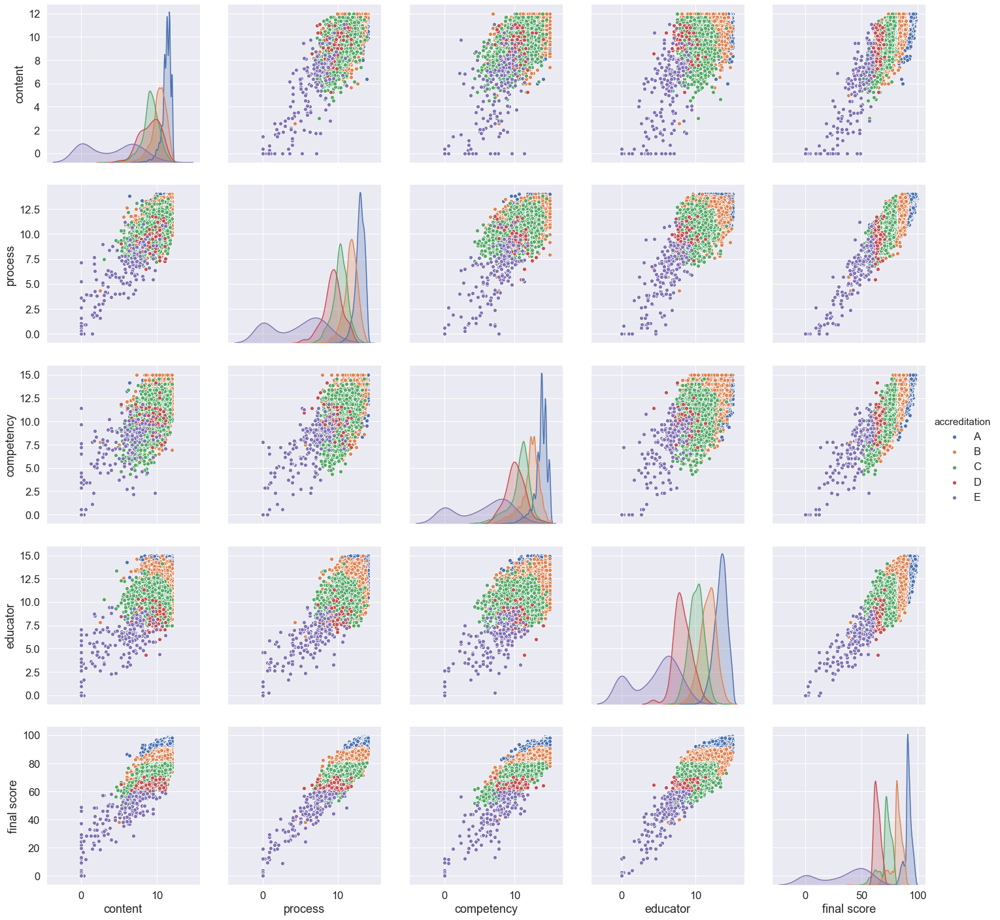

In [27]:
sns.set(font_scale=1.5)
sns.pairplot(df04[['content', 'process', 'competency', 'educator', 'accreditation', 'final score']],
             hue='accreditation', hue_order=['A','B','C','D','E'], height=4);

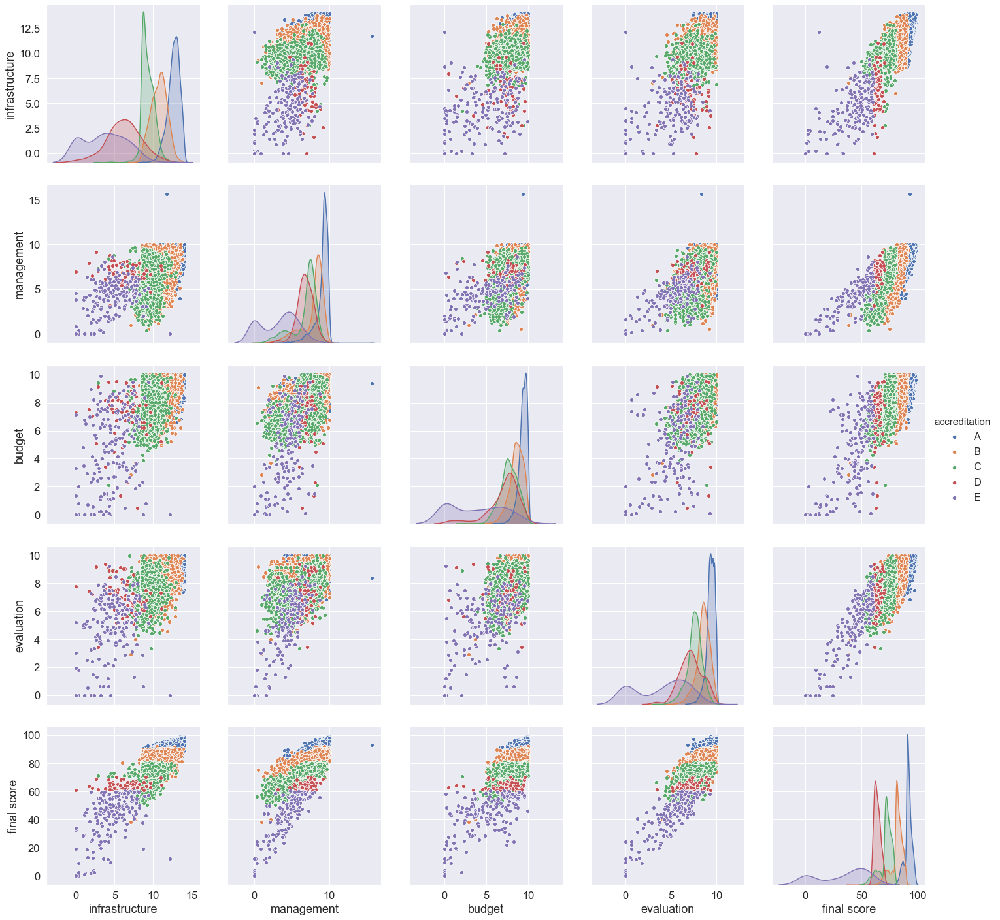

In [28]:
sns.set(font_scale=1.5)
sns.pairplot(df04[['infrastructure', 'management', 'budget', 'evaluation', 'accreditation', 'final score']],
             hue='accreditation', hue_order=['A','B','C','D','E'], height=4);

In [29]:
#outlier ==> 11222 & 10586 (refer to final score vs infrastructure)
pd.options.display.max_rows = 100
pd.options.display.max_columns = 100
df04[df04['accreditation'] == 'E'].iloc[:,9:19].sort_values(by=['infrastructure'], ascending=False)

,content,process,competency,educator,infrastructure,management,budget,evaluation,final score,accreditation
11222,0.000000,0.000000,0.000000,0.000000,12.181818,0.000000,0.000000,0.000000,12.181818,E
10406,2.818182,8.985075,7.788462,8.392857,9.409091,5.136364,9.488636,5.163043,57.181710,E
9472,3.454545,5.902985,7.067308,7.261905,9.045455,3.090909,0.795455,6.304348,42.922909,E
11062,5.363636,7.783582,8.509615,6.607143,8.863636,4.909091,8.352273,6.467391,56.856368,E
10586,1.454545,1.932836,1.153846,3.392857,8.681818,2.000000,0.000000,0.652174,19.268077,E
11526,1.727273,7.052239,5.192308,6.666667,8.636364,3.136364,2.329545,2.880435,37.621193,E
11489,6.363636,4.962687,9.663462,6.666667,8.181818,4.409091,2.102273,5.869565,48.219198,E
10996,3.545455,6.373134,9.086538,4.404762,8.181818,4.363636,6.818182,6.902174,49.675700,E
10068,7.000000,8.044776,8.942308,7.678571,8.136364,6.181818,6.306818,7.119565,59.410220,E
8923,7.181818,7.522388,9.951923,6.666667,7.954545,5.909091,7.045455,7.989130,60.221017,E


In [30]:
#outlier ==> 10 (refer to final score vs management)
df04[df04['accreditation'] == 'A'].iloc[:,9:19].sort_values(by=['management'], ascending=False)

,content,process,competency,educator,infrastructure,management,budget,evaluation,final score,accreditation
10,11.090909,11.597015,12.403846,12.916667,11.772727,15.636364,9.375000,8.369565,93.162093,A
8643,11.636364,13.843284,14.423077,14.642857,13.863636,10.000000,10.000000,9.673913,98.083131,A
7895,12.000000,13.529851,15.000000,13.511905,12.136364,10.000000,9.602273,10.000000,95.780392,A
3401,12.000000,13.373134,13.990385,13.988095,12.681818,10.000000,9.886364,10.000000,95.919796,A
2149,12.000000,13.686567,13.846154,14.226190,13.772727,10.000000,9.545455,9.782609,96.859702,A
8759,12.000000,13.686567,15.000000,12.202381,14.000000,10.000000,10.000000,10.000000,96.888948,A
8765,11.636364,13.634328,14.423077,14.107143,14.000000,10.000000,10.000000,9.836957,97.637868,A
8766,11.636364,13.686567,14.423077,13.035714,13.363636,10.000000,10.000000,9.456522,95.601880,A
5641,12.000000,13.320896,15.000000,14.047619,14.000000,10.000000,9.318182,9.456522,97.143218,A
7903,12.000000,13.686567,13.990385,13.809524,13.727273,10.000000,10.000000,10.000000,97.213748,A


In [31]:
#remove outliers
df05 = df04.drop([10,10586,11222]).reset_index(drop=True)

# Check for more outliers

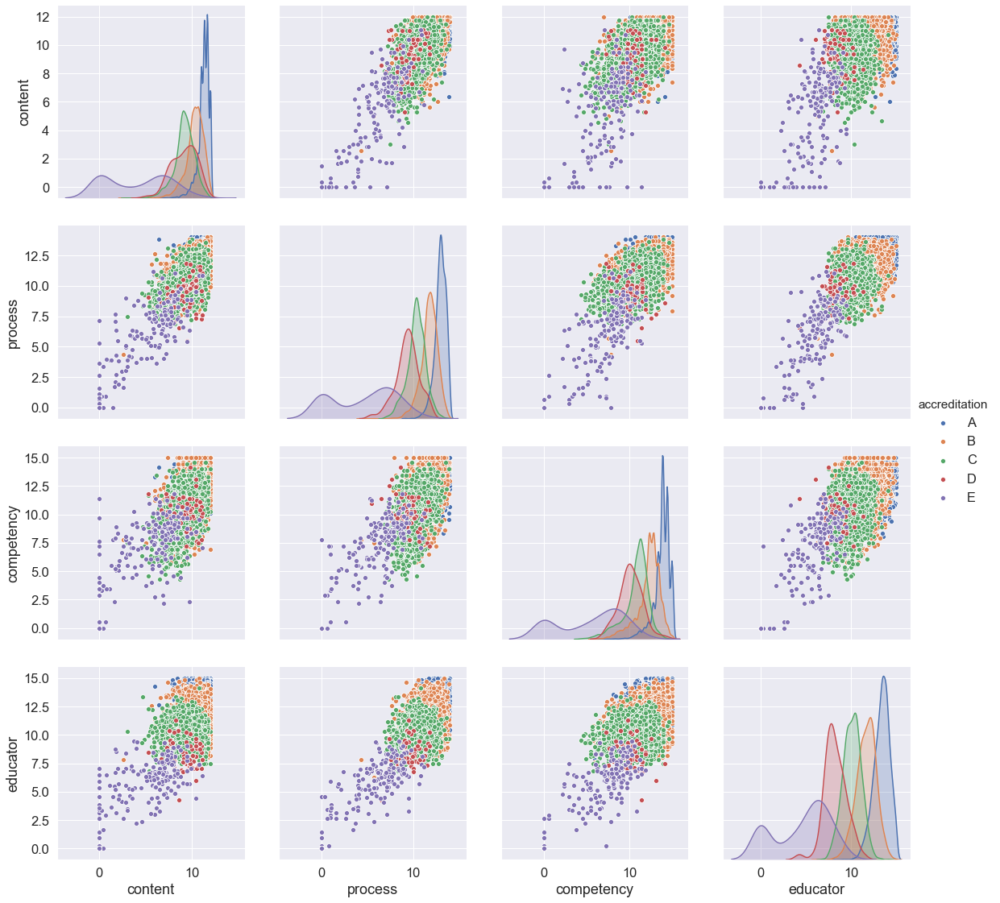

In [32]:
sns.set(font_scale=1.5)
sns.pairplot(df05[['content', 'process', 'competency', 'educator', 'accreditation']],
             hue='accreditation', hue_order=['A','B','C','D','E'], height=4);

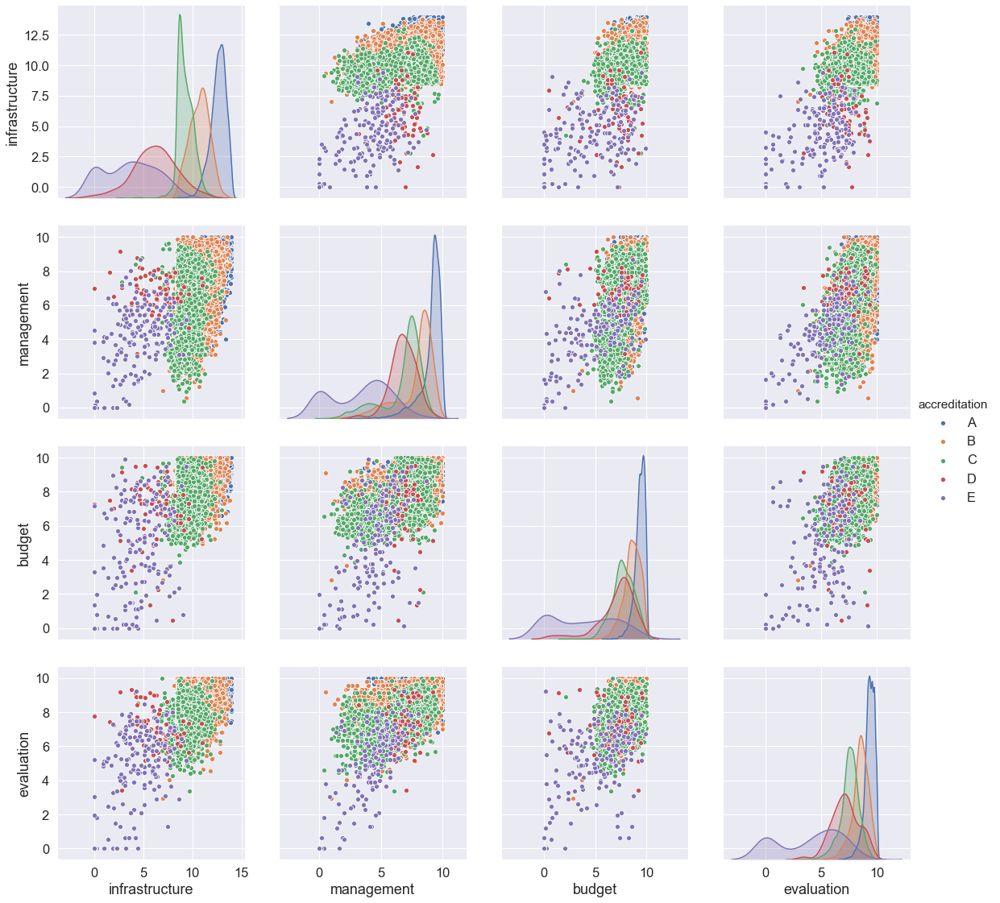

In [33]:
sns.set(font_scale=1.5)
sns.pairplot(df05[['infrastructure', 'management', 'budget', 'evaluation', 'accreditation']],
             hue='accreditation', hue_order=['A','B','C','D','E'], height=4);

# PCA to summarize 8 categories to 3 summarized features (for better visual)

In [34]:
df05.head()

,no,npsn,school,address,school type,status,education level,province,city,content,process,competency,educator,infrastructure,management,budget,evaluation,final score,accreditation,year,content01,content02,content03,content04,content05,content06,content07,content08,content09,process01,process02,process03,process04,process05,process06,process07,process08,process09,process10,process11,process12,process13,process14,process15,process16,process17,process18,process19,process20,process21,...,infrastructure24,infrastructure25,infrastructure26,infrastructure27,infrastructure28,management01,management02,management03,management04,management05,management06,management07,management08,management09,management10,management11,management12,management13,management14,management15,management16,budget01,budget02,budget03,budget04,budget05,budget06,budget07,budget08,budget09,budget10,budget11,budget12,budget13,budget14,budget15,budget16,evaluation01,evaluation02,evaluation03,evaluation04,evaluation05,evaluation06,evaluation07,evaluation08,evaluation09,evaluation10,evaluation11,evaluation12,evaluation13
0,1,10100541,SMAN 1 SIGLI,"KOMPLEK PELAJAR TIJUE, KEC. KOTA SIGLI",Sekolah,Negeri,SMA/MA,ACEH,KABUPATEN PIDIE,12.000000,13.477612,15.000000,14.761905,13.772727,9.681818,9.602273,9.184783,97.481117,A,2015,1.454545,1.454545,1.454545,1.090909,1.454545,1.090909,1.454545,1.090909,1.454545,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.835821,0.626866,0.470149,0.626866,0.470149,...,0.363636,0.545455,0.545455,0.363636,0.181818,0.727273,0.727273,0.727273,0.363636,0.545455,0.727273,0.545455,0.545455,0.545455,0.545455,0.409091,0.727273,0.727273,0.727273,0.545455,0.545455,0.681818,0.681818,0.454545,0.681818,0.681818,0.454545,0.511364,0.681818,0.681818,0.454545,0.454545,0.681818,0.454545,0.681818,0.681818,0.681818,0.869565,0.869565,0.869565,0.869565,0.869565,0.869565,0.869565,0.652174,0.652174,0.652174,0.000000,0.489130,0.652174
1,2,10108241,SMAN UNGGUL SIGLI,"JL. TIBANG - KRUENG RAYA, KEC. PIDIE",Sekolah,Negeri,SMA/MA,ACEH,KABUPATEN PIDIE,11.363636,14.000000,14.423077,14.285714,12.727273,10.000000,9.545455,9.565217,95.910372,A,2015,1.454545,1.454545,1.454545,1.090909,1.090909,0.818182,1.454545,1.090909,1.454545,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,...,0.363636,0.545455,0.545455,0.363636,0.181818,0.727273,0.727273,0.727273,0.363636,0.545455,0.727273,0.545455,0.545455,0.545455,0.545455,0.545455,0.727273,0.727273,0.727273,0.727273,0.545455,0.681818,0.681818,0.454545,0.681818,0.681818,0.454545,0.681818,0.681818,0.681818,0.454545,0.454545,0.681818,0.454545,0.681818,0.681818,0.454545,0.652174,0.869565,0.652174,0.869565,0.869565,0.869565,0.869565,0.652174,0.652174,0.652174,0.652174,0.652174,0.652174
2,3,10108245,SMAN 2 INDRAJAYA,"DS.MESJID DIJIEM,KEC.INDRAJAYA",Sekolah,Negeri,SMA/MA,ACEH,KABUPATEN PIDIE,11.363636,14.000000,14.423077,14.285714,12.727273,10.000000,9.545455,9.565217,95.910372,A,2015,1.454545,1.454545,1.454545,1.090909,1.090909,0.818182,1.454545,1.090909,1.454545,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,...,0.363636,0.545455,0.545455,0.363636,0.181818,0.727273,0.727273,0.727273,0.363636,0.545455,0.727273,0.545455,0.545455,0.545455,0.545455,0.545455,0.727273,0.727273,0.727273,0.727273,0.545455,0.681818,0.681818,0.454545,0.681818,0.681818,0.454545,0.681818,0.681818,0.681818,0.454545,0.454545,0.681818,0.454545,0.681818,0.681818,0.454545,0.652174,0.869565,0.652174,0.869565,0.869565,0.869565,0.869565,0.652174,0.652174,0.652174,0.652174,0.652174,0.652174
3,4,10113045,SMAN JANGKA BUYA,JANGKA BUYA,Sekolah,Negeri,SMA/MA,ACEH,PIDIE JAYA,11.636364,12.119403,11.250000,13.095238,1

In [35]:
X = df05.iloc[:,9:17]

In [36]:
Xs = (X-X.mean())/X.std()

In [37]:
pca = PCA().fit(Xs)

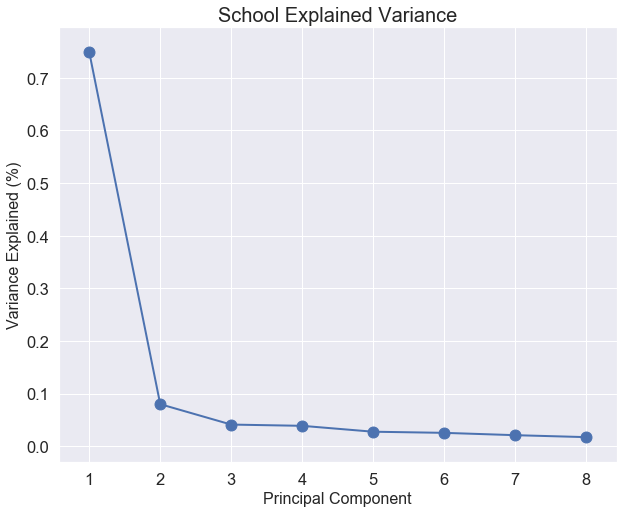

In [38]:
#determining the number of principal components. In this case, 3 PCs looks reasonable.
fig, ax = plt.subplots(figsize=(10,8))
ax.plot(range(1, len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_, lw=2)
ax.scatter(range(1, len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_, s=120)
ax.set_title('School Explained Variance', fontsize=20)
ax.set_xlabel('Principal Component', fontsize=16)
ax.set_ylabel('Variance Explained (%)', fontsize=16)
plt.show()

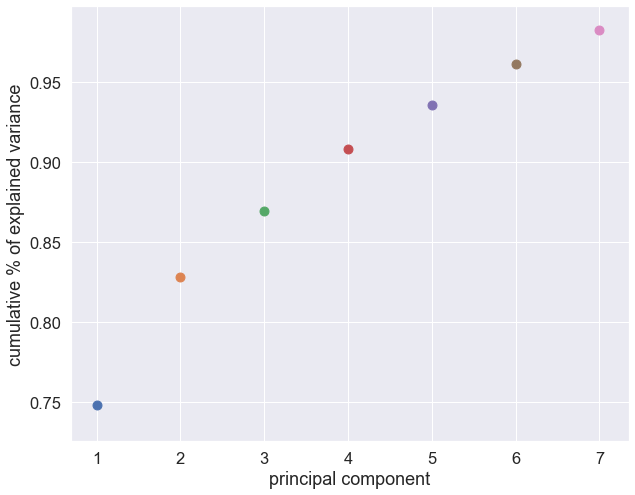

In [39]:
plt.subplots(figsize=(10,8))
for i in range(1,len(pca.explained_variance_ratio_)):
    plt.scatter(i, sum(pca.explained_variance_ratio_[:i]), s=80)
plt.xlabel("principal component")
plt.ylabel('cumulative % of explained variance');

In [40]:
# PCA with 3 components
pca3 = PCA(n_components=3, random_state=43)

In [41]:
print(pca3.fit(Xs))
print('==========')
print(np.cumsum(pca3.explained_variance_))
print('==========')
print(np.cumsum(pca3.explained_variance_ratio_))
print('==========')
print(pca3.components_)

# Do the transformation here!
Xs_pca3 = pca3.transform(Xs)
print(type(Xs_pca3))

# Make a list of PC names. Should equal ['PC1', 'PC2', ...]
features_pca3 = ['PC' + str(i) for i in range(pca3.n_components_)] 

# Turn the PCs into a dataframe
Xs_pca3 = pd.DataFrame(Xs_pca3, columns=features_pca3)
Xs_pca3.head()

Xs_pca3.shape

PCA(copy=True, iterated_power='auto', n_components=3, random_state=43,
    svd_solver='auto', tol=0.0, whiten=False)
[5.98612525 6.62590064 6.95584119]
[0.74826566 0.82823758 0.86948015]
[[-0.3642577  -0.37711632 -0.36495953 -0.33579586 -0.34044955 -0.33162319
  -0.34896165 -0.36261717]
 [ 0.16672221 -0.02545617  0.12930536 -0.60010727 -0.52349476  0.50963069
   0.23060709  0.08807517]
 [-0.45699807 -0.31892317  0.16414072  0.12939447  0.31620353  0.61359446
   0.05727289 -0.40742195]]
<class 'numpy.ndarray'>


(11586, 3)

In [42]:
Xs_pca3.head()

,PC0,PC1,PC2
0,-3.134567,-0.641171,0.469309
1,-2.882518,-0.208659,0.286951
2,-2.882518,-0.208659,0.286951
3,-0.805196,-0.840460,-0.219345
4,-1.936327,-0.366814,0.609535


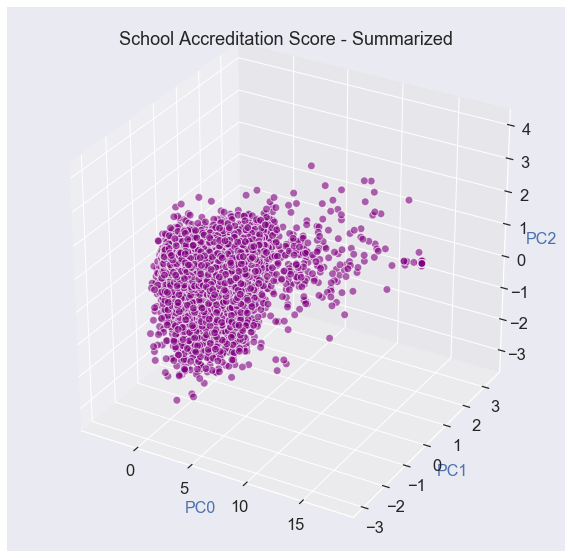

In [43]:
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
plt.title('School Accreditation Score - Summarized')
ax.scatter(Xs_pca3['PC0'], Xs_pca3['PC1'], Xs_pca3['PC2'], c='purple', s=60, alpha=0.6, edgecolors='w')
ax.set_xlabel('PC0', fontsize=16, c='b')
ax.set_ylabel('PC1', fontsize=16, c='b')
ax.set_zlabel('PC2', fontsize=16, c='b')
plt.show()

# Isolation Forest to detect anomaly

In [44]:
#### contamination=[0.05,0.03,0.02,0.01] ==> choose 5% because it detects outliers in the given dataset.
#### Lower contaminations will tend to include outliers as normal data point.
iso = IsolationForest(n_estimators=100, max_features=3, max_samples='auto', random_state=44, verbose=0, contamination=0.05,
                      behaviour="new")
iso.fit(Xs_pca3[['PC0', 'PC1', 'PC2']])

IsolationForest(behaviour='new', bootstrap=False, contamination=0.05,
                max_features=3, max_samples='auto', n_estimators=100,
                n_jobs=None, random_state=44, verbose=0, warm_start=False)

In [45]:
df05['anomaly5p'] = pd.DataFrame(iso.predict(Xs_pca3[['PC0', 'PC1', 'PC2']]))
Xs_pca3['anomaly5p'] = pd.DataFrame(iso.predict(Xs_pca3[['PC0', 'PC1', 'PC2']]))

In [46]:
Xs_pca3

,PC0,PC1,PC2,anomaly5p
0,-3.134567,-0.641171,0.469309,1
1,-2.882518,-0.208659,0.286951,1
2,-2.882518,-0.208659,0.286951,1
3,-0.805196,-0.840460,-0.219345,1
4,-1.936327,-0.366814,0.609535,1
5,-0.453231,-0.417157,0.849310,1
6,-2.117025,-0.652411,0.400730,1
7,-0.475206,-0.407099,0.821741,1
8,-2.646306,-0.138838,-0.015330,1
9,-0.851057,-0.640827,0.392450,1


# Random Forest to determine feature importance

In [47]:
X_train, X_test, y_train, y_test = train_test_split(df05[['content','process','competency','educator','infrastructure',
                                                          'management', 'budget', 'evaluation']], df05[['anomaly5p']],
                                                    test_size=0.3, random_state=51, stratify=df05['anomaly5p'])

In [48]:
X_train = X_train.values
X_test = X_test.values
y_train = y_train.values
y_test = y_test.values

In [49]:
model = []
parameters = []
scores = []
precision = []
recall = []
roc_auc = []

# To put the name of model, models from sklearn, and hyperparameters of the model we want to search through in order

names = ['RandomForest']

estimators = [RandomForestClassifier(random_state=52)]

params = [
    {'clf__max_depth': [5, 8, 15, 25, 30],
     'clf__n_estimators':[100, 150], #10 was taken out
     'clf__max_features':[2,3,4,5,6,7,8], #1 was taken out
     'clf__min_samples_split':[2, 50]}] #100, 500, 1000 was taken out

for name, estimator, param in zip(names, estimators, params):
    clf_pipe = Pipeline([('clf', estimator)])
    
####cv = StratifiedKFold(shuffle=True, n_splits=3)
    cv = StratifiedShuffleSplit(n_splits=5, test_size=0.2, random_state=50)
    gs = GridSearchCV(clf_pipe, param_grid=param, cv=cv, verbose=1, n_jobs=2)
    gs.fit(X_train, y_train.ravel())
    #gs.fit(X_train, y_train)
    
    print(name)
    print('Best Score: {}'.format(gs.best_score_))
    print('Best Params: {}'.format(gs.best_params_))
    
    # Best Model
    grid_model = gs.best_estimator_
    
    print('Model Score on X_train: {}'.format(grid_model.score(X_train, y_train)))
    
    # Prediction and score
    pred = grid_model.predict(X_test)
    print('Accuracy score of prediction: {}'.format(accuracy_score(y_test, pred)))
    print ('ROC_AUC score: {}'.format(roc_auc_score(y_test,pred)))
    
    # Confusion Matrix 
    conf_matrix = confusion_matrix(y_test, pred)
    
    tn, fp, fn, tp = confusion_matrix(y_test, pred).ravel()
    print('TN: {}, FP:{}, FN:{}, TP:{}'.format(tn,fp,fn,tp))
    print('Precision of the model is {}'. format(tp/(tp+fp)))
    print('Recall of the model is {}'.format(tp/(tp+fn)))
    
    print('\n')
    model.append(name)
    parameters.append(gs.best_params_)
    scores.append(accuracy_score(y_test, pred))
    recall.append(tp/(tp+fn))
    precision.append(tp/(tp+fp))
    roc_auc.append(roc_auc_score(y_test,pred))
    
pd.DataFrame({'model': model, 'parameters': parameters, 'scores': scores, 
              'recall': recall, 'precision': precision, 'roc_auc':roc_auc})

Fitting 5 folds for each of 140 candidates, totalling 700 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:   13.5s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:  1.3min
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed:  4.4min
[Parallel(n_jobs=2)]: Done 700 out of 700 | elapsed:  8.1min finished


RandomForest
Best Score: 0.9859432799013563
Best Params: {'clf__max_depth': 25, 'clf__max_features': 2, 'clf__min_samples_split': 2, 'clf__n_estimators': 100}
Model Score on X_train: 1.0
Accuracy score of prediction: 0.9841772151898734
ROC_AUC score: 0.8718975612133364
TN: 130, FP:44, FN:11, TP:3291
Precision of the model is 0.9868065967016492
Recall of the model is 0.9966686856450636




,model,parameters,scores,recall,precision,roc_auc
0,RandomForest,"{'clf__max_depth': 25, 'clf__max_features': 2,...",0.984177,0.996669,0.986807,0.871898


In [50]:
rf = RandomForestClassifier(max_depth=25, max_features=2, min_samples_split=2, n_estimators=100).fit(df05[['content','process','competency','educator','infrastructure', 'management', 'budget', 'evaluation']], df05[['anomaly5p']])

E:\Program Files\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  """Entry point for launching an IPython kernel.


In [51]:
df05['rf_pred'] = rf.predict(df05[['content','process','competency','educator','infrastructure', 'management', 'budget',
                                   'evaluation']])

In [52]:
df05

,no,npsn,school,address,school type,status,education level,province,city,content,process,competency,educator,infrastructure,management,budget,evaluation,final score,accreditation,year,content01,content02,content03,content04,content05,content06,content07,content08,content09,process01,process02,process03,process04,process05,process06,process07,process08,process09,process10,process11,process12,process13,process14,process15,process16,process17,process18,process19,process20,process21,...,infrastructure26,infrastructure27,infrastructure28,management01,management02,management03,management04,management05,management06,management07,management08,management09,management10,management11,management12,management13,management14,management15,management16,budget01,budget02,budget03,budget04,budget05,budget06,budget07,budget08,budget09,budget10,budget11,budget12,budget13,budget14,budget15,budget16,evaluation01,evaluation02,evaluation03,evaluation04,evaluation05,evaluation06,evaluation07,evaluation08,evaluation09,evaluation10,evaluation11,evaluation12,evaluation13,anomaly5p,rf_pred
0,1,10100541,SMAN 1 SIGLI,"KOMPLEK PELAJAR TIJUE, KEC. KOTA SIGLI",Sekolah,Negeri,SMA/MA,ACEH,KABUPATEN PIDIE,12.000000,13.477612,15.000000,14.761905,13.772727,9.681818,9.602273,9.184783,97.481117,A,2015,1.454545,1.454545,1.454545,1.090909,1.454545,1.090909,1.454545,1.090909,1.454545,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.835821,0.626866,0.470149,0.626866,0.470149,...,0.545455,0.363636,0.181818,0.727273,0.727273,0.727273,0.363636,0.545455,0.727273,0.545455,0.545455,0.545455,0.545455,0.409091,0.727273,0.727273,0.727273,0.545455,0.545455,0.681818,0.681818,0.454545,0.681818,0.681818,0.454545,0.511364,0.681818,0.681818,0.454545,0.454545,0.681818,0.454545,0.681818,0.681818,0.681818,0.869565,0.869565,0.869565,0.869565,0.869565,0.869565,0.869565,0.652174,0.652174,0.652174,0.000000,0.489130,0.652174,1,1
1,2,10108241,SMAN UNGGUL SIGLI,"JL. TIBANG - KRUENG RAYA, KEC. PIDIE",Sekolah,Negeri,SMA/MA,ACEH,KABUPATEN PIDIE,11.363636,14.000000,14.423077,14.285714,12.727273,10.000000,9.545455,9.565217,95.910372,A,2015,1.454545,1.454545,1.454545,1.090909,1.090909,0.818182,1.454545,1.090909,1.454545,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,...,0.545455,0.363636,0.181818,0.727273,0.727273,0.727273,0.363636,0.545455,0.727273,0.545455,0.545455,0.545455,0.545455,0.545455,0.727273,0.727273,0.727273,0.727273,0.545455,0.681818,0.681818,0.454545,0.681818,0.681818,0.454545,0.681818,0.681818,0.681818,0.454545,0.454545,0.681818,0.454545,0.681818,0.681818,0.454545,0.652174,0.869565,0.652174,0.869565,0.869565,0.869565,0.869565,0.652174,0.652174,0.652174,0.652174,0.652174,0.652174,1,1
2,3,10108245,SMAN 2 INDRAJAYA,"DS.MESJID DIJIEM,KEC.INDRAJAYA",Sekolah,Negeri,SMA/MA,ACEH,KABUPATEN PIDIE,11.363636,14.000000,14.423077,14.285714,12.727273,10.000000,9.545455,9.565217,95.910372,A,2015,1.454545,1.454545,1.454545,1.090909,1.090909,0.818182,1.454545,1.090909,1.454545,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,...,0.545455,0.363636,0.181818,0.727273,0.727273,0.727273,0.363636,0.545455,0.727273,0.545455,0.545455,0.545455,0.545455,0.545455,0.727273,0.727273,0.727273,0.727273,0.545455,0.681818,0.681818,0.454545,0.681818,0.681818,0.454545,0.681818,0.681818,0.681818,0.454545,0.454545,0.681818,0.454545,0.681818,0.681818,0.454545,0.652174,0.869565,0.652174,0.869565,0.869565,0.869565,0.869565,0.652174,0.652174,0.652174,0.652174,0.652174,0.652174,1,1
3,4,10113045,SMAN JANGKA BUYA,JANGKA BUYA,Sekolah,Negeri,SMA/MA,ACEH,PIDIE JAYA,11.636364,12.119403,11.250000,13.095238,12.772727,7.863636,8.693182,8.586957,86.017507,A,2015,1.454

In [53]:
rf.feature_importances_

array([0.10330394, 0.09697697, 0.0672977 , 0.11790442, 0.17332895,
       0.29875289, 0.06441173, 0.0780234 ])

In [54]:
features = df05[['content','process','competency','educator','infrastructure', 'management', 'budget', 'evaluation']].columns

In [55]:
features

Index(['content', 'process', 'competency', 'educator', 'infrastructure',
       'management', 'budget', 'evaluation'],
      dtype='object')

In [56]:
coefs = pd.DataFrame({'variable':features,'coef':rf.feature_importances_})

In [57]:
coefs.sort_values(by=['coef'], ascending=False)

,variable,coef
5,management,0.298753
4,infrastructure,0.173329
3,educator,0.117904
0,content,0.103304
1,process,0.096977
7,evaluation,0.078023
2,competency,0.067298
6,budget,0.064412


#### feature importances --> the features contribute to outliers are management, infrastructure, educator.

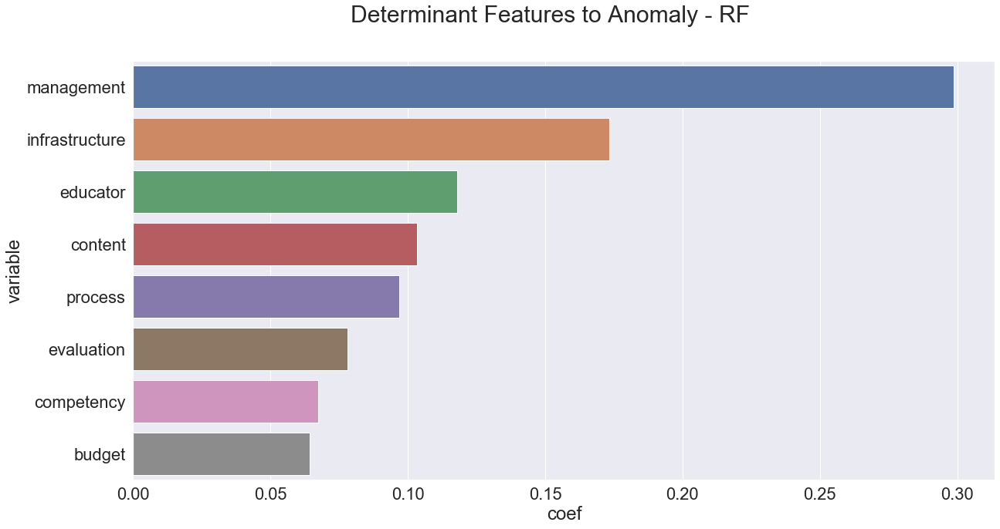

In [58]:
sns.set(style='darkgrid', font_scale=2);
plt.figure(figsize=(20,10))
sns.barplot(x='coef', y='variable', data=coefs.sort_values(by=['coef'], ascending=False))
plt.suptitle('Determinant Features to Anomaly - RF', fontsize=30);

# K-means clustering to estimate the correct classification

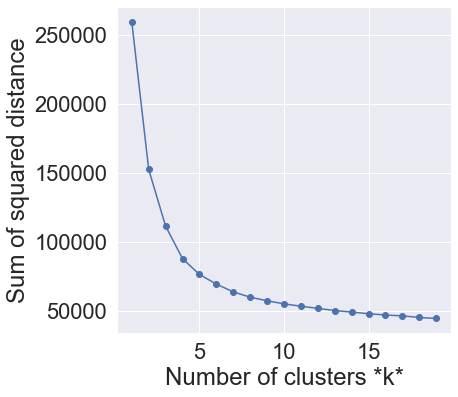

In [59]:
sse = []
list_k = list(range(1, 20))

for k in list_k:
    km = KMeans(n_clusters=k)
    km.fit(df05[['content','process','competency','educator','infrastructure', 'management', 'budget', 'evaluation']])
    sse.append(km.inertia_)
    
# Plot sse against k
plt.figure(figsize=(6, 6))
plt.plot(list_k, sse, '-o')
plt.xlabel(r'Number of clusters *k*')
plt.ylabel('Sum of squared distance');

In [60]:
kmeans05 = KMeans(n_clusters=5, init='k-means++', random_state=30, tol=0.00001, max_iter=500).fit(df05[['content','process','competency','educator','infrastructure', 'management', 'budget', 'evaluation']])
print('Label: ', kmeans05.labels_)
print('Prediction: ', kmeans05.predict(df05[['content','process','competency','educator','infrastructure', 'management', 'budget', 'evaluation']]))
print('Cluster Center: ', kmeans05.cluster_centers_)

Label:  [0 0 0 ... 0 0 0]
Prediction:  [0 0 0 ... 0 0 0]
Cluster Center:  [[11.29257474 12.9925336  13.93297237 13.36747395 12.66331727  9.16564827
   9.38215708  9.37530441]
 [ 7.72024108  8.98608477  8.47893646  9.31703828  8.51739076  4.26908589
   6.4454106   6.77703879]
 [ 9.37602539 10.60108296 10.94204347 10.51310275  9.69464605  6.80319346
   7.91192654  7.78235441]
 [10.54031086 11.95552863 12.59065427 11.70055058 10.74014313  8.28827016
   8.76030135  8.69323226]
 [ 0.7460815   1.13544347  2.00431034  1.73782157  1.39393939  1.10867294
   1.45702717  1.27123938]]


In [61]:
df05['label'] = kmeans05.predict(df05[['content','process','competency','educator','infrastructure', 'management', 'budget', 'evaluation']])

In [62]:
df05[['accreditation','final score']].groupby(['accreditation']).max()

,final score
accreditation,
A,99.463042
B,92.075409
C,80.738057
D,70.465588
E,60.496809


In [63]:
df05[['label','final score']].groupby(['label']).max().sort_values(by='final score',ascending=False)

,final score
label,
0,99.463042
3,89.844921
2,80.006450
1,70.732885
4,37.133543


In [64]:
df05['label_idx'] = df05['label'].apply(lambda x: 'A' if x == 0 else
                                        ('B' if x == 3 else
                                         ('C' if x == 2 else
                                          ('D' if x == 1 else 'E'))))
df05

,no,npsn,school,address,school type,status,education level,province,city,content,process,competency,educator,infrastructure,management,budget,evaluation,final score,accreditation,year,content01,content02,content03,content04,content05,content06,content07,content08,content09,process01,process02,process03,process04,process05,process06,process07,process08,process09,process10,process11,process12,process13,process14,process15,process16,process17,process18,process19,process20,process21,...,infrastructure28,management01,management02,management03,management04,management05,management06,management07,management08,management09,management10,management11,management12,management13,management14,management15,management16,budget01,budget02,budget03,budget04,budget05,budget06,budget07,budget08,budget09,budget10,budget11,budget12,budget13,budget14,budget15,budget16,evaluation01,evaluation02,evaluation03,evaluation04,evaluation05,evaluation06,evaluation07,evaluation08,evaluation09,evaluation10,evaluation11,evaluation12,evaluation13,anomaly5p,rf_pred,label,label_idx
0,1,10100541,SMAN 1 SIGLI,"KOMPLEK PELAJAR TIJUE, KEC. KOTA SIGLI",Sekolah,Negeri,SMA/MA,ACEH,KABUPATEN PIDIE,12.000000,13.477612,15.000000,14.761905,13.772727,9.681818,9.602273,9.184783,97.481117,A,2015,1.454545,1.454545,1.454545,1.090909,1.454545,1.090909,1.454545,1.090909,1.454545,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.835821,0.626866,0.470149,0.626866,0.470149,...,0.181818,0.727273,0.727273,0.727273,0.363636,0.545455,0.727273,0.545455,0.545455,0.545455,0.545455,0.409091,0.727273,0.727273,0.727273,0.545455,0.545455,0.681818,0.681818,0.454545,0.681818,0.681818,0.454545,0.511364,0.681818,0.681818,0.454545,0.454545,0.681818,0.454545,0.681818,0.681818,0.681818,0.869565,0.869565,0.869565,0.869565,0.869565,0.869565,0.869565,0.652174,0.652174,0.652174,0.000000,0.489130,0.652174,1,1,0,A
1,2,10108241,SMAN UNGGUL SIGLI,"JL. TIBANG - KRUENG RAYA, KEC. PIDIE",Sekolah,Negeri,SMA/MA,ACEH,KABUPATEN PIDIE,11.363636,14.000000,14.423077,14.285714,12.727273,10.000000,9.545455,9.565217,95.910372,A,2015,1.454545,1.454545,1.454545,1.090909,1.090909,0.818182,1.454545,1.090909,1.454545,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,...,0.181818,0.727273,0.727273,0.727273,0.363636,0.545455,0.727273,0.545455,0.545455,0.545455,0.545455,0.545455,0.727273,0.727273,0.727273,0.727273,0.545455,0.681818,0.681818,0.454545,0.681818,0.681818,0.454545,0.681818,0.681818,0.681818,0.454545,0.454545,0.681818,0.454545,0.681818,0.681818,0.454545,0.652174,0.869565,0.652174,0.869565,0.869565,0.869565,0.869565,0.652174,0.652174,0.652174,0.652174,0.652174,0.652174,1,1,0,A
2,3,10108245,SMAN 2 INDRAJAYA,"DS.MESJID DIJIEM,KEC.INDRAJAYA",Sekolah,Negeri,SMA/MA,ACEH,KABUPATEN PIDIE,11.363636,14.000000,14.423077,14.285714,12.727273,10.000000,9.545455,9.565217,95.910372,A,2015,1.454545,1.454545,1.454545,1.090909,1.090909,0.818182,1.454545,1.090909,1.454545,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,...,0.181818,0.727273,0.727273,0.727273,0.363636,0.545455,0.727273,0.545455,0.545455,0.545455,0.545455,0.545455,0.727273,0.727273,0.727273,0.727273,0.545455,0.681818,0.681818,0.454545,0.681818,0.681818,0.454545,0.681818,0.681818,0.681818,0.454545,0.454545,0.681818,0.454545,0.681818,0.681818,0.454545,0.652174,0.869565,0.652174,0.869565,0.869565,0.869565,0.869565,0.652174,0.652174,0.652174,0.652174,0.652174,0.652174,1,1,0,A
3,4,10113045,SMAN JANGKA BUYA,JANGKA BUYA,Sekolah,Negeri,SMA/MA,ACEH,PIDIE JAYA,11.636364,12.119403,11.250000,13.095238,12.772727,7.863636,8.693182,8.586957,86.017507,A,2015,1.454545,1.454545,1.454545,1.090909,1.454545,1.090909,1.454545,1.

In [65]:
df05[['label_idx','final score']].groupby(['label_idx']).max().sort_values(by='final score',ascending=False)

,final score
label_idx,
A,99.463042
B,89.844921
C,80.006450
D,70.732885
E,37.133543


In [66]:
df05.to_csv('.\part-02\high_school_05_rf.csv', index=False)

# Highly accredited school = good quality?
## To answer this, I will use National Exam data as a quality measurement.
## My initial & intuitive hypothesis is students from good schools will have better National Exam score.

In [67]:
import matplotlib
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso, LassoCV
from sklearn.ensemble import RandomForestRegressor
from scipy.stats import f_oneway
from scipy import stats

In [68]:
school = pd.read_csv('.\part-02\high_school_05_rf.csv')
exam = pd.read_csv('.\part-02\exam_02.csv')

E:\Program Files\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3057: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [69]:
print(school.shape)
print(exam.shape)

(11586, 153)
(53570, 14)


In [70]:
school.dtypes

no                    int64
npsn                  int64
school               object
address              object
school type          object
status               object
education level      object
province             object
city                 object
content             float64
process             float64
competency          float64
educator            float64
infrastructure      float64
management          float64
budget              float64
evaluation          float64
final score         float64
accreditation        object
year                  int64
content01           float64
content02           float64
content03           float64
content04           float64
content05           float64
content06           float64
content07           float64
content08           float64
content09           float64
process01           float64
process02           float64
process03           float64
process04           float64
process05           float64
process06           float64
process07           

In [71]:
school['npsn'] = school['npsn'].astype('str')
school['year'] = school['year'].astype('str')

In [72]:
school['npsnyear'] = school['npsn'] + school['year']
school.head()

,no,npsn,school,address,school type,status,education level,province,city,content,process,competency,educator,infrastructure,management,budget,evaluation,final score,accreditation,year,content01,content02,content03,content04,content05,content06,content07,content08,content09,process01,process02,process03,process04,process05,process06,process07,process08,process09,process10,process11,process12,process13,process14,process15,process16,process17,process18,process19,process20,process21,...,management01,management02,management03,management04,management05,management06,management07,management08,management09,management10,management11,management12,management13,management14,management15,management16,budget01,budget02,budget03,budget04,budget05,budget06,budget07,budget08,budget09,budget10,budget11,budget12,budget13,budget14,budget15,budget16,evaluation01,evaluation02,evaluation03,evaluation04,evaluation05,evaluation06,evaluation07,evaluation08,evaluation09,evaluation10,evaluation11,evaluation12,evaluation13,anomaly5p,rf_pred,label,label_idx,npsnyear
0,1,10100541,SMAN 1 SIGLI,"KOMPLEK PELAJAR TIJUE, KEC. KOTA SIGLI",Sekolah,Negeri,SMA/MA,ACEH,KABUPATEN PIDIE,12.000000,13.477612,15.000000,14.761905,13.772727,9.681818,9.602273,9.184783,97.481117,A,2015,1.454545,1.454545,1.454545,1.090909,1.454545,1.090909,1.454545,1.090909,1.454545,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.835821,0.626866,0.470149,0.626866,0.470149,...,0.727273,0.727273,0.727273,0.363636,0.545455,0.727273,0.545455,0.545455,0.545455,0.545455,0.409091,0.727273,0.727273,0.727273,0.545455,0.545455,0.681818,0.681818,0.454545,0.681818,0.681818,0.454545,0.511364,0.681818,0.681818,0.454545,0.454545,0.681818,0.454545,0.681818,0.681818,0.681818,0.869565,0.869565,0.869565,0.869565,0.869565,0.869565,0.869565,0.652174,0.652174,0.652174,0.000000,0.489130,0.652174,1,1,0,A,101005412015
1,2,10108241,SMAN UNGGUL SIGLI,"JL. TIBANG - KRUENG RAYA, KEC. PIDIE",Sekolah,Negeri,SMA/MA,ACEH,KABUPATEN PIDIE,11.363636,14.000000,14.423077,14.285714,12.727273,10.000000,9.545455,9.565217,95.910372,A,2015,1.454545,1.454545,1.454545,1.090909,1.090909,0.818182,1.454545,1.090909,1.454545,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,...,0.727273,0.727273,0.727273,0.363636,0.545455,0.727273,0.545455,0.545455,0.545455,0.545455,0.545455,0.727273,0.727273,0.727273,0.727273,0.545455,0.681818,0.681818,0.454545,0.681818,0.681818,0.454545,0.681818,0.681818,0.681818,0.454545,0.454545,0.681818,0.454545,0.681818,0.681818,0.454545,0.652174,0.869565,0.652174,0.869565,0.869565,0.869565,0.869565,0.652174,0.652174,0.652174,0.652174,0.652174,0.652174,1,1,0,A,101082412015
2,3,10108245,SMAN 2 INDRAJAYA,"DS.MESJID DIJIEM,KEC.INDRAJAYA",Sekolah,Negeri,SMA/MA,ACEH,KABUPATEN PIDIE,11.363636,14.000000,14.423077,14.285714,12.727273,10.000000,9.545455,9.565217,95.910372,A,2015,1.454545,1.454545,1.454545,1.090909,1.090909,0.818182,1.454545,1.090909,1.454545,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,...,0.727273,0.727273,0.727273,0.363636,0.545455,0.727273,0.545455,0.545455,0.545455,0.545455,0.545455,0.727273,0.727273,0.727273,0.727273,0.545455,0.681818,0.681818,0.454545,0.681818,0.681818,0.454545,0.681818,0.681818,0.681818,0.454545,0.454545,0.681818,0.454545,0.681818,0.681818,0.454545,0.652174,0.869565,0.652174,0.869565,0.869565,0.869565,0.869565,0.652174,0.652174,0.652174,0.652174,0.652174,0.652174,1,1,0,A,101082452015
3,4,10113045,SMAN JANGKA BUYA,JANGKA BUYA,Sekolah,Negeri,SMA/MA,ACEH,PIDIE JAYA,11.636364,12.119403,11.250000,13.095238,12.772727,7.863636,8.693182,8.586957,86.017507,A,2015,1.454545,1.454545,1.454545,1.090909,1.454545,1.090909,1.45454

In [73]:
exam.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53570 entries, 0 to 53569
Data columns (total 14 columns):
no              53570 non-null int64
code            53570 non-null int64
school          53570 non-null object
npsn            53570 non-null object
status          53570 non-null object
participant     53570 non-null int64
indonesian      53570 non-null float64
english         53570 non-null float64
math            53570 non-null float64
physics         53570 non-null float64
chemistry       53570 non-null float64
biology         53570 non-null float64
average_exam    53570 non-null float64
year            53570 non-null int64
dtypes: float64(7), int64(4), object(3)
memory usage: 5.7+ MB


In [74]:
exam['year'] = exam['year'].astype('str')
exam['npsnyear'] = exam['npsn'] + exam['year']
exam.head()

,no,code,school,npsn,status,participant,indonesian,english,math,physics,chemistry,biology,average_exam,year,npsnyear
0,1,201001,"SMA NEGERI 1 BANDUNG, KOTA BANDUNG",20219271,N,299,82.45,71.78,64.27,83.72,75.71,74.32,75.375000,2015,202192712015
1,2,201002,"SMA NEGERI 2 BANDUNG, KOTA BANDUNG",20219254,N,353,84.59,79.28,74.39,89.21,84.48,84.96,82.818333,2015,202192542015
2,3,201003,"SMA NEGERI 3 BANDUNG, KOTA BANDUNG",20219327,N,311,86.55,82.57,76.72,87.23,84.53,79.96,82.926667,2015,202193272015
3,4,201004,"SMA NEGERI 4 BANDUNG, KOTA BANDUNG",20219312,N,343,83.83,72.86,67.87,80.63,75.66,76.99,76.306667,2015,202193122015
4,5,201005,"SMA NEGERI 5 BANDUNG, KOTA BANDUNG",20219309,N,291,83.25,76.38,65.38,81.57,75.64,75.84,76.343333,2015,202193092015


In [75]:
school_exam = pd.merge(school, exam.iloc[:,5:15].drop(['year'], axis=1), on='npsnyear', how='inner')
school_exam.head()

,no,npsn,school,address,school type,status,education level,province,city,content,process,competency,educator,infrastructure,management,budget,evaluation,final score,accreditation,year,content01,content02,content03,content04,content05,content06,content07,content08,content09,process01,process02,process03,process04,process05,process06,process07,process08,process09,process10,process11,process12,process13,process14,process15,process16,process17,process18,process19,process20,process21,...,management09,management10,management11,management12,management13,management14,management15,management16,budget01,budget02,budget03,budget04,budget05,budget06,budget07,budget08,budget09,budget10,budget11,budget12,budget13,budget14,budget15,budget16,evaluation01,evaluation02,evaluation03,evaluation04,evaluation05,evaluation06,evaluation07,evaluation08,evaluation09,evaluation10,evaluation11,evaluation12,evaluation13,anomaly5p,rf_pred,label,label_idx,npsnyear,participant,indonesian,english,math,physics,chemistry,biology,average_exam
0,1,10100541,SMAN 1 SIGLI,"KOMPLEK PELAJAR TIJUE, KEC. KOTA SIGLI",Sekolah,Negeri,SMA/MA,ACEH,KABUPATEN PIDIE,12.000000,13.477612,15.000000,14.761905,13.772727,9.681818,9.602273,9.184783,97.481117,A,2015,1.454545,1.454545,1.454545,1.090909,1.454545,1.090909,1.454545,1.090909,1.454545,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.835821,0.626866,0.470149,0.626866,0.470149,...,0.545455,0.545455,0.409091,0.727273,0.727273,0.727273,0.545455,0.545455,0.681818,0.681818,0.454545,0.681818,0.681818,0.454545,0.511364,0.681818,0.681818,0.454545,0.454545,0.681818,0.454545,0.681818,0.681818,0.681818,0.869565,0.869565,0.869565,0.869565,0.869565,0.869565,0.869565,0.652174,0.652174,0.652174,0.000000,0.489130,0.652174,1,1,0,A,101005412015,241,86.46,79.35,75.33,78.38,83.26,72.32,79.183333
1,2,10108241,SMAN UNGGUL SIGLI,"JL. TIBANG - KRUENG RAYA, KEC. PIDIE",Sekolah,Negeri,SMA/MA,ACEH,KABUPATEN PIDIE,11.363636,14.000000,14.423077,14.285714,12.727273,10.000000,9.545455,9.565217,95.910372,A,2015,1.454545,1.454545,1.454545,1.090909,1.090909,0.818182,1.454545,1.090909,1.454545,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,...,0.545455,0.545455,0.545455,0.727273,0.727273,0.727273,0.727273,0.545455,0.681818,0.681818,0.454545,0.681818,0.681818,0.454545,0.681818,0.681818,0.681818,0.454545,0.454545,0.681818,0.454545,0.681818,0.681818,0.454545,0.652174,0.869565,0.652174,0.869565,0.869565,0.869565,0.869565,0.652174,0.652174,0.652174,0.652174,0.652174,0.652174,1,1,0,A,101082412015,62,86.36,80.12,69.57,88.41,80.65,74.59,79.950000
2,4,10113045,SMAN JANGKA BUYA,JANGKA BUYA,Sekolah,Negeri,SMA/MA,ACEH,PIDIE JAYA,11.636364,12.119403,11.250000,13.095238,12.772727,7.863636,8.693182,8.586957,86.017507,A,2015,1.454545,1.454545,1.454545,1.090909,1.454545,1.090909,1.454545,1.090909,1.090909,0.470149,0.626866,0.626866,0.626866,0.626866,0.470149,0.470149,0.470149,0.835821,0.626866,0.626866,0.626866,0.470149,0.626866,0.626866,0.626866,0.626866,0.470149,0.626866,0.470149,0.470149,...,0.545455,0.409091,0.409091,0.545455,0.727273,0.545455,0.545455,0.409091,0.000000,0.511364,0.454545,0.681818,0.681818,0.454545,0.681818,0.681818,0.681818,0.454545,0.454545,0.511364,0.340909,0.681818,0.511364,0.909091,0.652174,0.652174,0.652174,0.652174,0.869565,0.652174,0.869565,0.652174,0.489130,0.652174,0.652174,0.489130,0.652174,1,1,3,B,101130452015,48,77.51,63.48,75.60,78.03,89.43,69.02,75.511667
3,5,10105183,SMAN 1 BUKIT,JL. BALE ATU - SIMPANG TIGA REDELONG,Sekolah,Negeri,SMA/MA,ACEH,BENER MERIAH,10.363636,12.955224,12.836538,13.333333,13.272727,9.681818,9.488636,9.456522,91.388436,A,2015,1.454545,1.454545,1.090909,0.818182,1.090909,0.818182,1.090909,1.090909,1.454545,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,

In [76]:
school_exam.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7118 entries, 0 to 7117
Columns: 162 entries, no to average_exam
dtypes: float64(145), int64(5), object(12)
memory usage: 8.9+ MB


In [77]:
school_exam.shape

(7118, 162)

In [78]:
se = school_exam[['content', 'process', 'competency', 'educator', 'infrastructure', 'management', 'budget',
                   'evaluation', 'final score', 'label_idx', 'average_exam']]

In [79]:
print(se.head())
print(se.shape)

     content    process  competency   educator  infrastructure  management  \
0  12.000000  13.477612   15.000000  14.761905       13.772727    9.681818   
1  11.363636  14.000000   14.423077  14.285714       12.727273   10.000000   
2  11.636364  12.119403   11.250000  13.095238       12.772727    7.863636   
3  10.363636  12.955224   12.836538  13.333333       13.272727    9.681818   
4  10.272727  11.544776   12.692308  12.559524       12.500000    9.000000   

     budget  evaluation  final score label_idx  average_exam  
0  9.602273    9.184783    97.481117         A     79.183333  
1  9.545455    9.565217    95.910372         A     79.950000  
2  8.693182    8.586957    86.017507         B     75.511667  
3  9.488636    9.456522    91.388436         A     76.140000  
4  8.295455    8.206522    85.071311         B     75.918333  
(7118, 11)


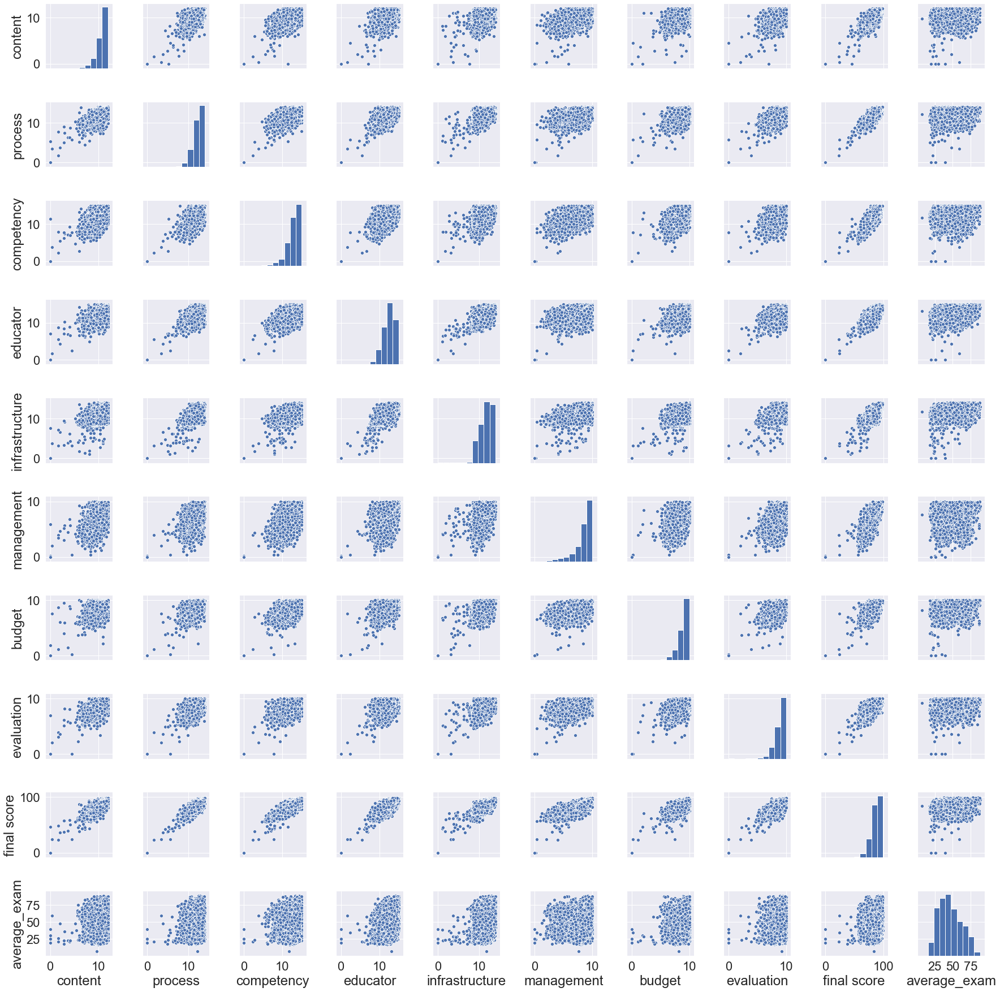

In [80]:
sns.set(font_scale=2)
sns.pairplot(se);

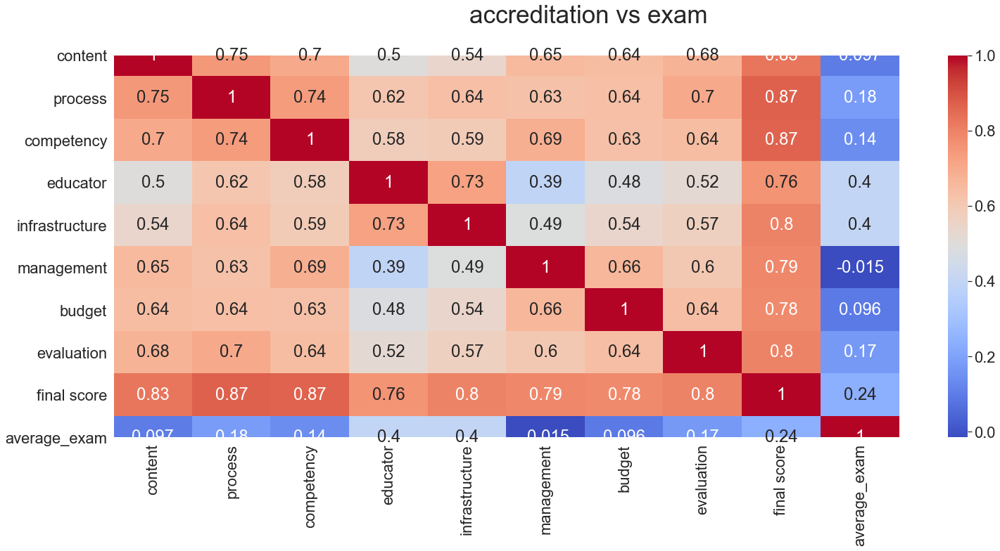

In [81]:
sns.set(font_scale=2)
plt.figure(figsize=(25,10))
sns.heatmap(se.corr(), annot=True, cmap='coolwarm')
plt.suptitle('accreditation vs exam', fontsize=35);

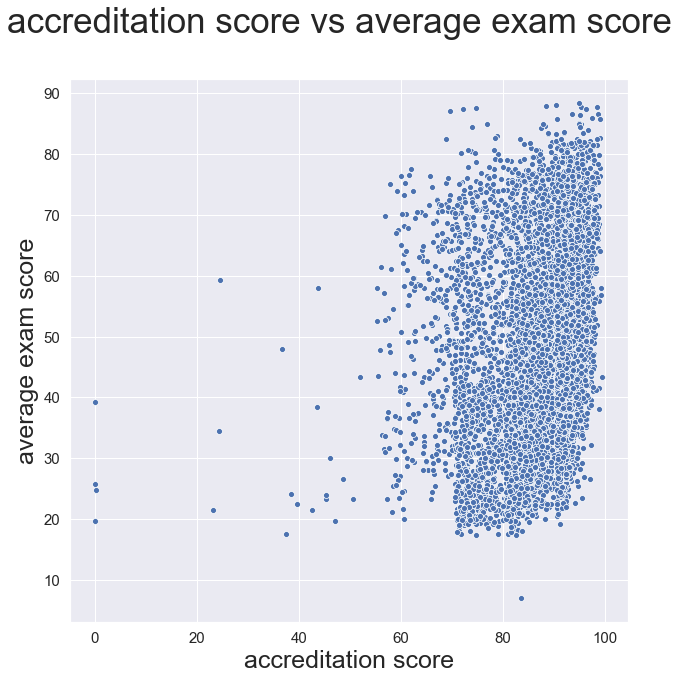

In [82]:
#checking outliers
plt.figure(figsize=(10,10))
sns.scatterplot(x='final score', y='average_exam', data=se)
plt.suptitle('accreditation score vs average exam score', fontsize=35)
plt.xlabel('accreditation score', fontsize=25)
plt.ylabel('average exam score', fontsize=25)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15);

In [83]:
#detecting outliers
se.sort_values(by=['final score']).head(30)

,content,process,competency,educator,infrastructure,management,budget,evaluation,final score,label_idx,average_exam
6870,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,E,39.275000
6767,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,E,19.645000
6704,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,E,25.703333
5988,0.000000,0.000000,0.000000,0.000000,0.000000,0.181818,0.000000,0.000000,0.181818,E,24.841667
6091,1.636364,1.723881,2.307692,5.476190,3.136364,3.954545,1.079545,3.913043,23.227625,E,21.456667
6814,4.545455,5.694030,7.788462,2.380952,3.227273,0.363636,0.227273,0.000000,24.227080,E,34.505000
7045,0.363636,3.395522,3.750000,1.666667,3.727273,2.000000,7.500000,2.119565,24.522663,E,59.228333
6700,2.090909,3.813433,5.480769,4.345238,6.590909,4.636364,6.022727,3.641304,36.621654,E,47.960000
6093,2.818182,4.962687,6.201923,7.023810,3.272727,3.045455,3.977273,6.195652,37.497708,D,17.583333
6923,6.000000,5.119403,2.740385,6.607143,1.772727,4.363636,6.988636,4.891304,38.483235,D,24.065000


In [84]:
se.sort_values(by=['final score']).head(30).index
#outliers:
#[6870, 6767, 6704, 5988, 6091, 6814, 7045, 6700, 6093, 6923, 6603,
#6677, 6581, 7025, 6861, 6798, 6771, 4869, 6951, 6682, 6873, 7039]

Int64Index([6870, 6767, 6704, 5988, 6091, 6814, 7045, 6700, 6093, 6923, 6603,
            6677, 6581, 7025, 6861, 6798, 6771, 4869, 6951, 6682, 6873, 7039,
             814, 1016, 1605, 1856, 1775,  652,  791,  285],
           dtype='int64')

In [85]:
se.sort_values(by=['average_exam']).head()
#outliers:
#[1758]

,content,process,competency,educator,infrastructure,management,budget,evaluation,final score,label_idx,average_exam
1758,9.727273,12.171642,11.682692,13.095238,11.772727,7.636364,8.181818,9.239130,83.506884,B,7.083333
2462,10.090909,10.761194,11.826923,9.523810,8.954545,7.954545,7.500000,8.043478,74.655405,C,17.300000
4523,10.454545,11.805970,12.692308,11.964286,10.863636,8.181818,7.954545,8.695652,82.612761,B,17.421667
6180,9.000000,10.186567,11.250000,9.761905,8.545455,7.727273,7.897727,7.391304,71.760231,C,17.530000
4611,10.363636,12.171642,12.548077,10.178571,10.818182,8.272727,8.522727,8.152174,81.027737,B,17.545000


In [86]:
#deleting outliers
idx = [1758,6870, 6767, 6704, 5988, 6091, 6814, 7045, 6700, 6093, 6923, 6603,
            6677, 6581, 7025, 6861, 6798, 6771, 4869, 6951, 6682, 6873, 7039]
se_01 = se.drop(idx)
se_01.shape

(7095, 11)

In [87]:
se00 = school_exam[['content', 'process', 'competency', 'educator', 'infrastructure', 'management', 'budget',
                   'evaluation', 'final score', 'accreditation', 'average_exam']].drop(idx)

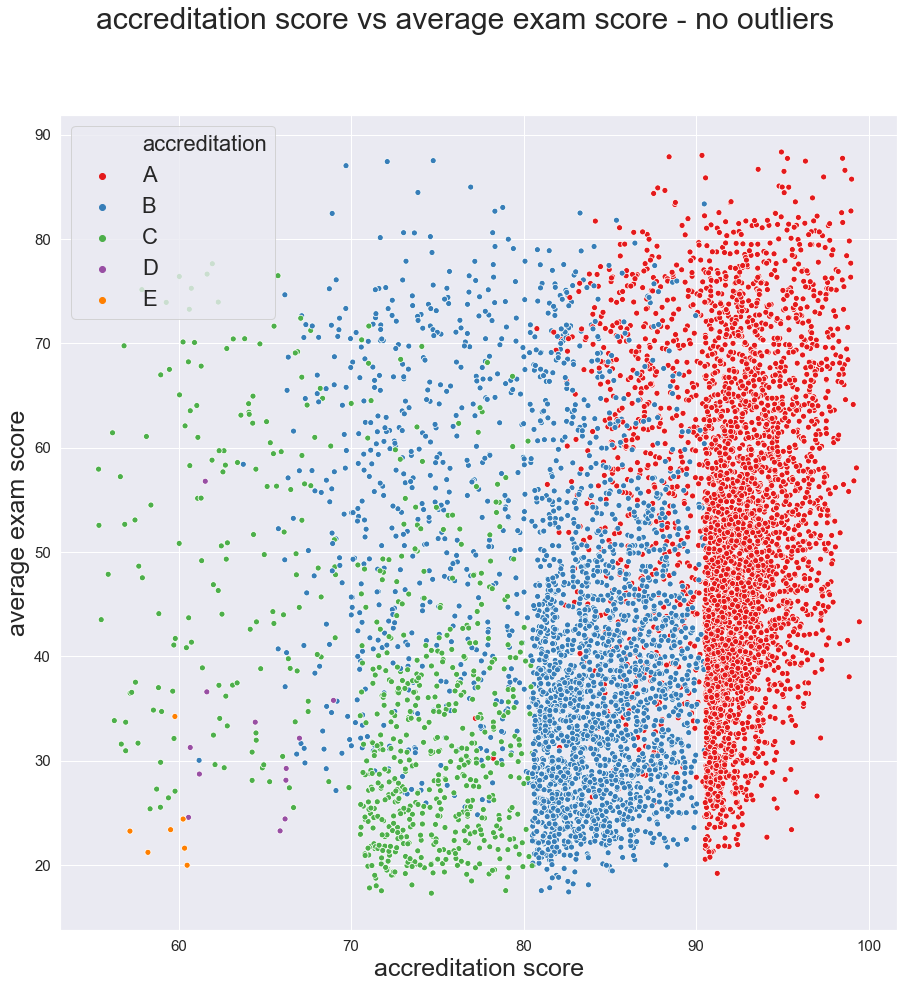

In [88]:
#plotting exam score vs accreditation score (original accreditaion label)
plt.figure(figsize=(15,15))
sns.scatterplot(x='final score', y='average_exam', data=se00, hue='accreditation', hue_order=['A','B','C','D','E'], palette='Set1')
plt.suptitle('accreditation score vs average exam score - no outliers', fontsize=30)
plt.xlabel('accreditation score', fontsize=25)
plt.ylabel('average exam score', fontsize=25)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15);

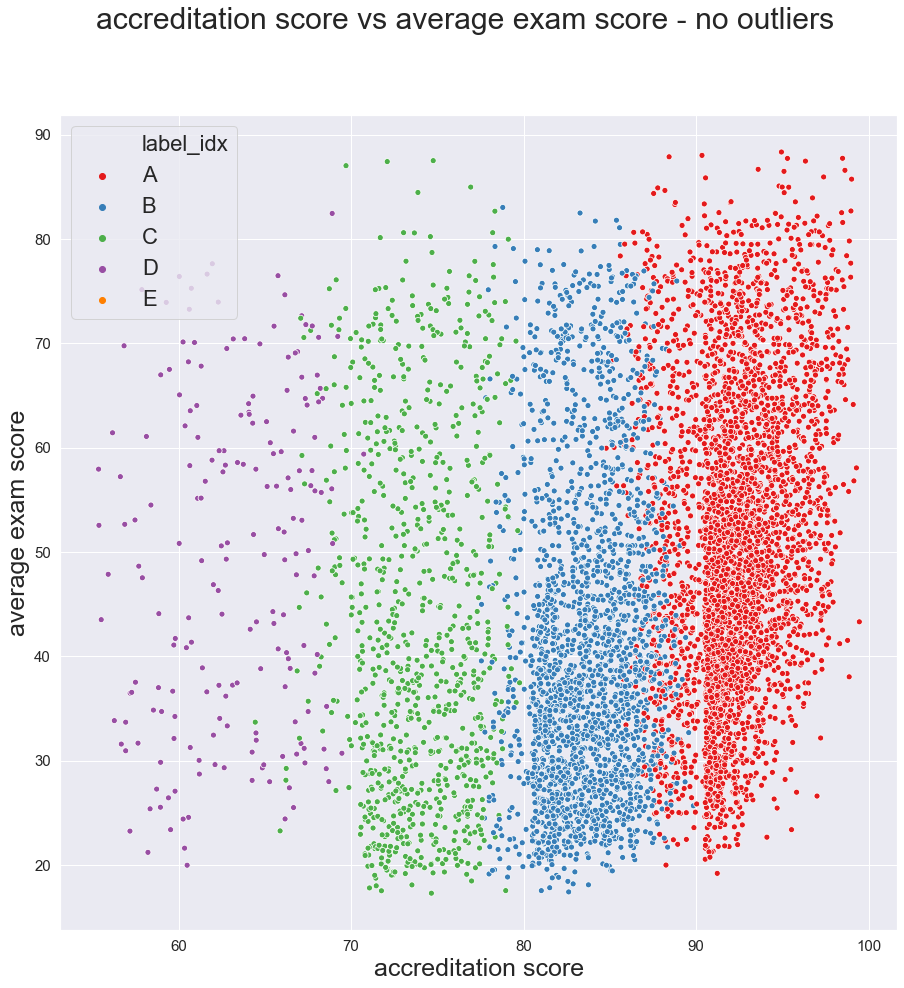

In [89]:
#plotting exam score vs accreditation score (KMeans accreditaion label)
plt.figure(figsize=(15,15))
sns.scatterplot(x='final score', y='average_exam', data=se_01, hue='label_idx', hue_order=['A','B','C','D','E'], palette='Set1')
plt.suptitle('accreditation score vs average exam score - no outliers', fontsize=30)
plt.xlabel('accreditation score', fontsize=25)
plt.ylabel('average exam score', fontsize=25)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15);

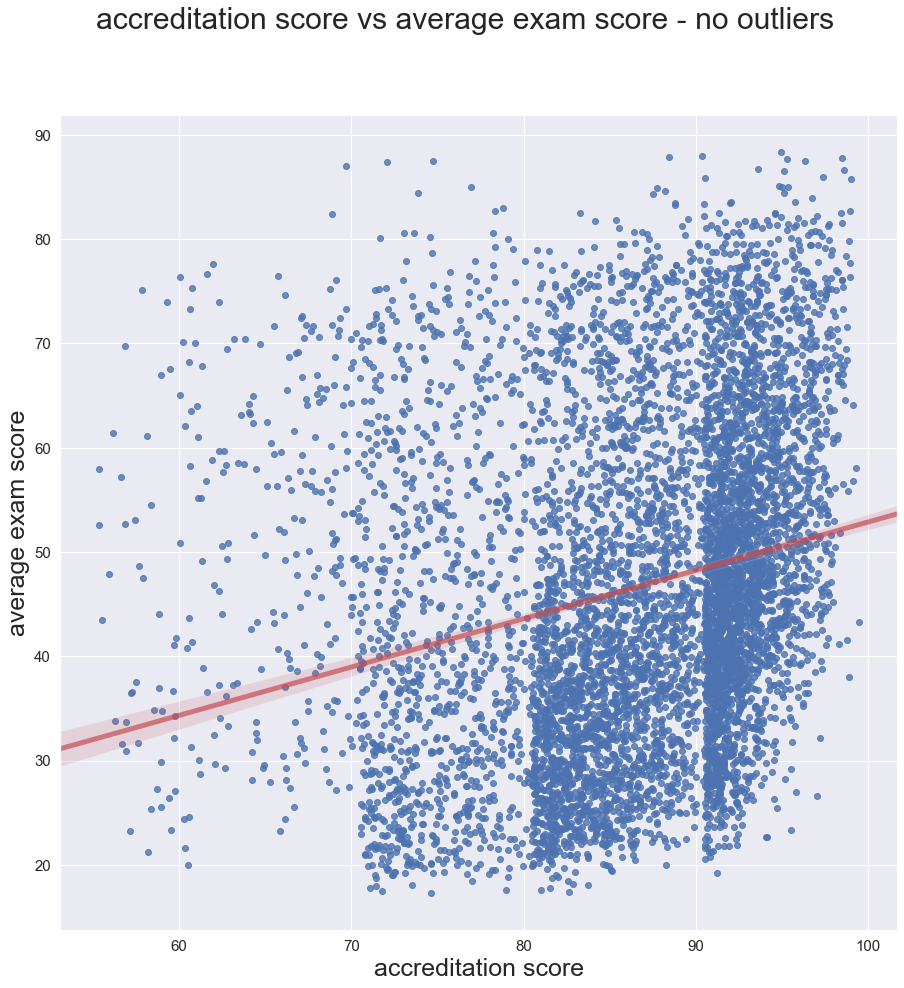

In [90]:
#plotting exam score vs accreditation score with trend line
plt.figure(figsize=(15,15))
sns.regplot(x='final score', y='average_exam', data=se_01, line_kws={"color":"r","alpha":0.7,"lw":5})
plt.suptitle('accreditation score vs average exam score - no outliers', fontsize=30)
plt.xlabel('accreditation score', fontsize=25)
plt.ylabel('average exam score', fontsize=25)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15);

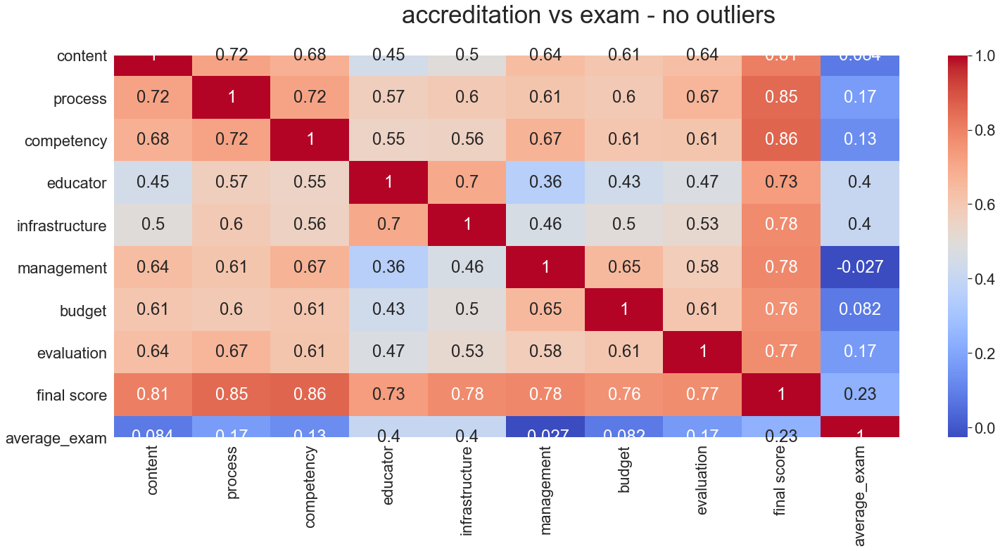

In [91]:
sns.set(font_scale=2)
plt.figure(figsize=(25,10))
sns.heatmap(se_01.corr(), annot=True, cmap='coolwarm')
plt.suptitle('accreditation vs exam - no outliers', fontsize=35);

In [92]:
#Data Frame for REGRESSION#
se_model = school_exam.iloc[:,17:].drop(['accreditation','year', 'npsnyear', 'participant', 'indonesian', 'english', 'math',
                                   'physics', 'chemistry', 'biology'], axis=1).drop(idx)

In [93]:
se_model.shape

(7095, 135)

# Regression with 129 features vs exam score

In [94]:
X = se_model.iloc[:,1:130]
y_exam = se_model['average_exam']

In [95]:
X_train, X_test, y_extrain, y_extest = train_test_split(X, y_exam, test_size=0.3, random_state=40)

In [96]:
lr = LinearRegression()

In [97]:
cross_val_score(lr, X_train, y_extrain, cv=5).mean()

0.33094095881031693

In [98]:
print(lr.fit(X_test, y_extest).score(X_test, y_extest))
print(lr.fit(X, y_exam).score(X, y_exam))
#not good model

0.3985434963498684
0.3721257509814995


In [99]:
model_exam = lr.fit(X, y_exam)
model_exam.coef_

array([ 6.28296744e-01, -4.58803850e-01,  2.56119419e+00, -3.09298007e-01,
       -1.56116027e+00, -2.57780342e+00, -2.21810241e+00,  2.04598455e-01,
        2.81005651e+00, -4.36336991e+00, -2.74962132e+00, -1.17595094e+00,
       -3.00990150e+00,  4.11707167e+00,  1.07429113e+00, -1.00194796e+00,
        5.03650868e+00,  3.15405699e+00,  3.70055227e+00,  4.06405106e+00,
        2.37374449e+00, -4.28890468e+00,  2.53006689e+00, -1.75693935e+00,
       -3.57051308e-01, -2.29532034e+00, -1.53179264e+00,  6.26564121e-01,
        2.27210070e-01, -1.71393699e+00,  7.28024069e-01, -4.73078586e-01,
        5.34254077e-01, -4.51334723e-01,  7.34249529e-01,  1.07178494e+00,
        1.34685748e+00,  2.52967751e+00,  4.48358358e+00,  9.00617927e-01,
       -3.88812335e-01,  1.80663353e-01,  3.83655445e-01, -1.94979270e+00,
        5.03579484e+00, -2.25343727e+00,  1.27845437e+00,  2.37487061e+00,
        6.15364444e-01,  5.47087525e-01,  2.30229287e+00, -3.73685368e+00,
       -1.57102962e+00,  

In [100]:
pred_exam = lr.fit(X, y_exam).predict(X)
error_exam = y_exam - pred_exam

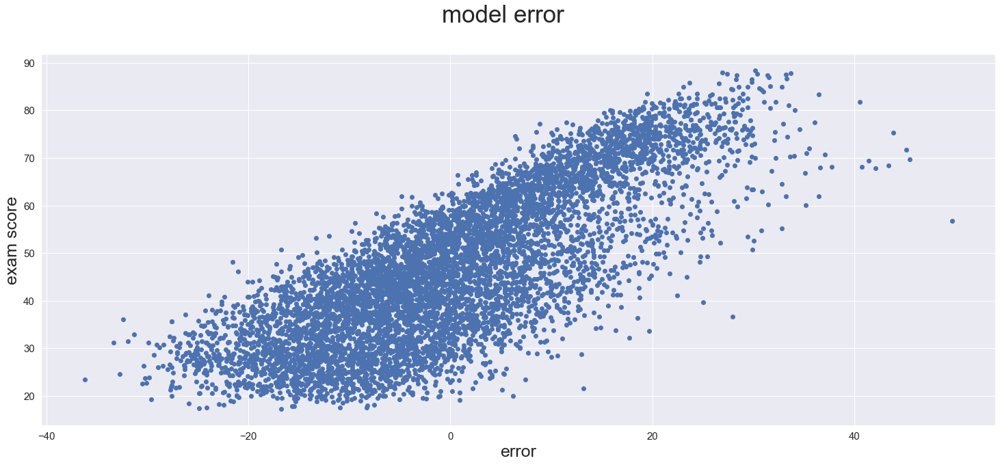

In [101]:
plt.figure(figsize=(25,10))
plt.scatter(error_exam, y_exam)
plt.suptitle('model error', fontsize=35)
plt.xlabel('error', fontsize=25)
plt.ylabel('exam score', fontsize=25)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15);
plt.show()

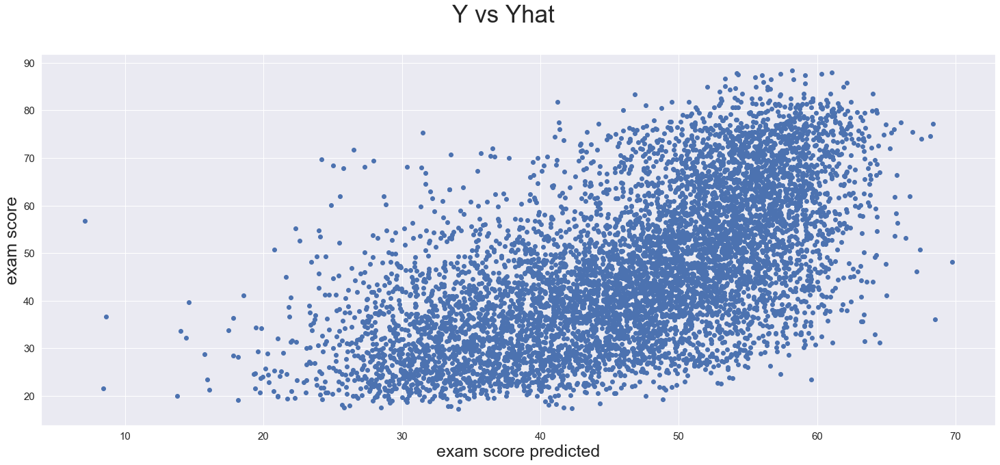

In [102]:
plt.figure(figsize=(25,10))
plt.scatter(pred_exam, y_exam)
plt.suptitle('Y vs Yhat', fontsize=35)
plt.xlabel('exam score predicted', fontsize=25)
plt.ylabel('exam score', fontsize=25)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15);
plt.show()

In [103]:
features = list(X.columns)
coefs = pd.DataFrame({'variable':features,'coef':model_exam.coef_,'abs_coef':np.abs(model_exam.coef_)})
coefs.sort_values(by=['coef'], ascending=False)

,variable,coef,abs_coef
70,infrastructure15,12.259103,12.259103
68,infrastructure13,8.776546,8.776546
53,educator17,8.488049,8.488049
63,infrastructure08,8.096526,8.096526
61,infrastructure06,7.515535,7.515535
59,infrastructure04,6.537459,6.537459
75,infrastructure20,5.901331,5.901331
56,infrastructure01,5.762451,5.762451
82,infrastructure27,5.377734,5.377734
76,infrastructure21,5.094826,5.094826


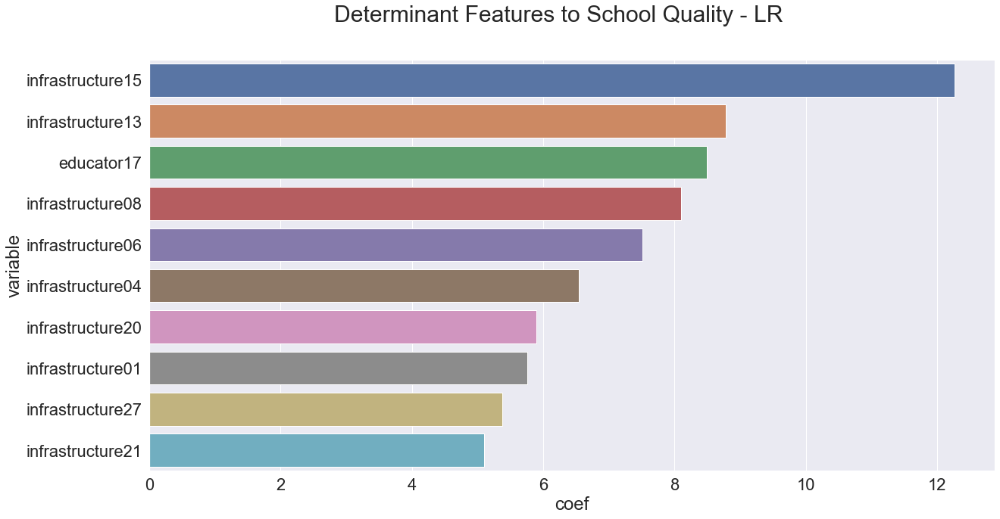

In [104]:
#Determinant features to school accreditation grade (quality)
sns.set(style='darkgrid', font_scale=2);
plt.figure(figsize=(20,10))
sns.barplot(x='coef', y='variable', data=coefs.sort_values(by=['coef'], ascending=False).head(10))
plt.suptitle('Determinant Features to School Quality - LR', fontsize=30);

# Random Forest

In [105]:
se_model.head()

,final score,content01,content02,content03,content04,content05,content06,content07,content08,content09,process01,process02,process03,process04,process05,process06,process07,process08,process09,process10,process11,process12,process13,process14,process15,process16,process17,process18,process19,process20,process21,competency01,competency02,competency03,competency04,competency05,competency06,competency07,educator01,educator02,educator03,educator04,educator05,educator06,educator07,educator08,educator09,educator10,educator11,educator12,...,management01,management02,management03,management04,management05,management06,management07,management08,management09,management10,management11,management12,management13,management14,management15,management16,budget01,budget02,budget03,budget04,budget05,budget06,budget07,budget08,budget09,budget10,budget11,budget12,budget13,budget14,budget15,budget16,evaluation01,evaluation02,evaluation03,evaluation04,evaluation05,evaluation06,evaluation07,evaluation08,evaluation09,evaluation10,evaluation11,evaluation12,evaluation13,anomaly5p,rf_pred,label,label_idx,average_exam
0,97.481117,1.454545,1.454545,1.454545,1.090909,1.454545,1.090909,1.454545,1.090909,1.454545,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.835821,0.626866,0.470149,0.626866,0.470149,2.307692,2.307692,2.307692,1.730769,2.307692,1.730769,2.307692,0.952381,0.714286,0.952381,0.952381,0.952381,0.952381,0.714286,0.714286,0.714286,0.952381,0.952381,0.714286,...,0.727273,0.727273,0.727273,0.363636,0.545455,0.727273,0.545455,0.545455,0.545455,0.545455,0.409091,0.727273,0.727273,0.727273,0.545455,0.545455,0.681818,0.681818,0.454545,0.681818,0.681818,0.454545,0.511364,0.681818,0.681818,0.454545,0.454545,0.681818,0.454545,0.681818,0.681818,0.681818,0.869565,0.869565,0.869565,0.869565,0.869565,0.869565,0.869565,0.652174,0.652174,0.652174,0.000000,0.489130,0.652174,1,1,0,A,79.183333
1,95.910372,1.454545,1.454545,1.454545,1.090909,1.090909,0.818182,1.454545,1.090909,1.454545,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,2.307692,2.307692,2.307692,1.730769,2.307692,1.730769,1.730769,0.952381,0.714286,0.952381,0.952381,0.952381,0.952381,0.476190,0.714286,0.714286,0.714286,0.952381,0.714286,...,0.727273,0.727273,0.727273,0.363636,0.545455,0.727273,0.545455,0.545455,0.545455,0.545455,0.545455,0.727273,0.727273,0.727273,0.727273,0.545455,0.681818,0.681818,0.454545,0.681818,0.681818,0.454545,0.681818,0.681818,0.681818,0.454545,0.454545,0.681818,0.454545,0.681818,0.681818,0.454545,0.652174,0.869565,0.652174,0.869565,0.869565,0.869565,0.869565,0.652174,0.652174,0.652174,0.652174,0.652174,0.652174,1,1,0,A,79.950000
2,86.017507,1.454545,1.454545,1.454545,1.090909,1.454545,1.090909,1.454545,1.090909,1.090909,0.470149,0.626866,0.626866,0.626866,0.626866,0.470149,0.470149,0.470149,0.835821,0.626866,0.626866,0.626866,0.470149,0.626866,0.626866,0.626866,0.626866,0.470149,0.626866,0.470149,0.470149,1.730769,1.730769,1.730769,1.298077,1.730769,1.298077,1.730769,0.714286,0.714286,0.952381,0.952381,0.952381,0.952381,0.952381,0.535714,0.714286,0.952381,0.714286,0.000000,...,0.727273,0.727273,0.545455,0.363636,0.409091,0.545455,0.000000,0.409091,0.545455,0.409091,0.409091,0.545455,0.727273,0.545455,0.545455,0.409091,0.000000,0.511364,0.454545,0.681818,0.681818,0.454545,0.681818,0.681818,0.681818,0.454545,0.454545,0.511364,0.340909,0.681818,0.511364,0.909091,0.652174,0.652174,0.652174,0.652174,0.869565,0.652174,0.869565,0.652174,0.489130,0.652174,0.652174,0.489130,0.652174,1,1,3,B,75.511667
3,91.388436,1.454545,1.454545,1.090909,0.818182,1.090909,0.818182,1.090909,1.090909,1.454545,0.626866,0.835821,0.626866,0.626866,0.626866,0.626866,0.626866,0.626866,0.835821,0.626866,0.626866,0.626866,0.470149,0.470149,0.626866,0.470149,0.626866,0.4701

In [106]:
X_rf = se_model.iloc[:,1:130].values
y_rf = se_model['average_exam'].values

In [107]:
rf = RandomForestRegressor(random_state=60)
model_rf = rf.fit(X_rf, y_rf)
print(model_rf.score(X_rf, y_rf))

E:\Program Files\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


0.8863984494718877


In [108]:
y_rf_hat = model_rf.predict(X_rf)

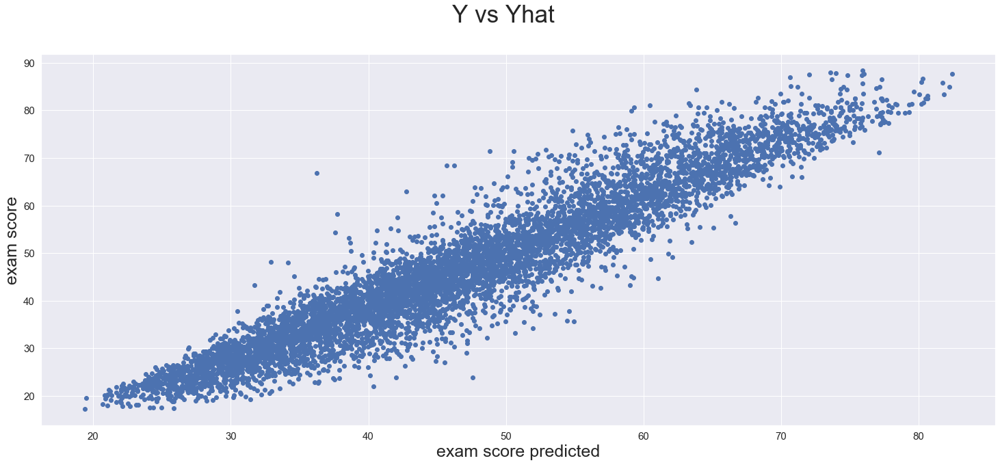

In [109]:
plt.figure(figsize=(25,10))
plt.scatter(y_rf_hat, y_rf)
plt.suptitle('Y vs Yhat', fontsize=35)
plt.xlabel('exam score predicted', fontsize=25)
plt.ylabel('exam score', fontsize=25)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15);
plt.show()

# Random Forest Regression model better explain the relationship between accreditation score & exam score

In [110]:
model_rf.feature_importances_

array([0.00322651, 0.0051021 , 0.00427331, 0.00495631, 0.00524597,
       0.00464962, 0.00567137, 0.00372899, 0.00517979, 0.00594866,
       0.00430453, 0.00502868, 0.00478533, 0.00952337, 0.00407947,
       0.00427947, 0.00504368, 0.00308469, 0.00607046, 0.00281573,
       0.00348239, 0.00384824, 0.00436554, 0.00526885, 0.00417508,
       0.00504972, 0.0042682 , 0.00406472, 0.00455556, 0.00430874,
       0.00291559, 0.00571946, 0.00498848, 0.0036933 , 0.0056173 ,
       0.00738364, 0.0054848 , 0.00785556, 0.02840552, 0.0048047 ,
       0.00275117, 0.00448955, 0.00210419, 0.00315552, 0.01298091,
       0.00895453, 0.00430306, 0.00346867, 0.00375627, 0.00375551,
       0.01200095, 0.00710255, 0.00807368, 0.05720957, 0.01373904,
       0.00561167, 0.00384929, 0.00263938, 0.00886039, 0.00346931,
       0.00311332, 0.02419584, 0.00278846, 0.00926244, 0.00533971,
       0.00757132, 0.00868733, 0.01309229, 0.11515968, 0.01032943,
       0.02650143, 0.00565067, 0.00565299, 0.00679666, 0.00426

In [111]:
features_rf = list(se_model.iloc[:,1:130].columns)
coefs_rf = pd.DataFrame({'variable':features_rf,'coef':model_rf.feature_importances_})

#top 10 determinant features
coefs_rf.sort_values(by=['coef'], ascending=False).head(10)

,variable,coef
68,infrastructure13,0.115160
53,educator17,0.057210
75,infrastructure20,0.041211
79,infrastructure24,0.032575
38,educator02,0.028406
70,infrastructure15,0.026501
61,infrastructure06,0.024196
87,management04,0.016404
54,educator18,0.013739
90,management07,0.013625


In [112]:
#least 10 determinant features
coefs_rf.sort_values(by=['coef'], ascending=False).tail(10)

,variable,coef
60,infrastructure05,0.003113
17,process09,0.003085
106,budget07,0.002949
30,competency01,0.002916
19,process11,0.002816
62,infrastructure07,0.002788
40,educator04,0.002751
57,infrastructure02,0.002639
109,budget10,0.002525
42,educator06,0.002104


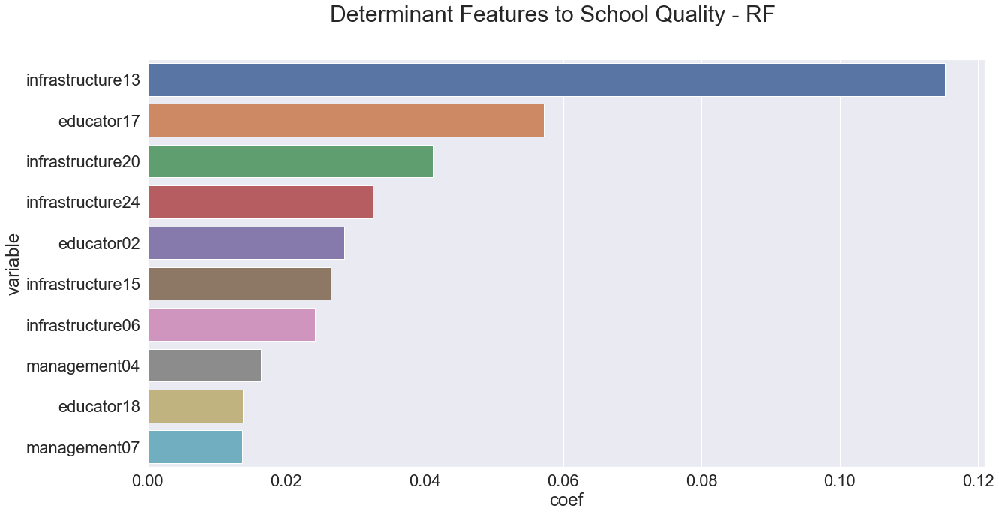

In [113]:
sns.set(style='darkgrid', font_scale=2);
plt.figure(figsize=(20,10))
sns.barplot(x='coef', y='variable', data=coefs_rf.sort_values(by=['coef'], ascending=False).head(10))
plt.suptitle('Determinant Features to School Quality - RF', fontsize=30);

# Does students from good school score better at National Exam?

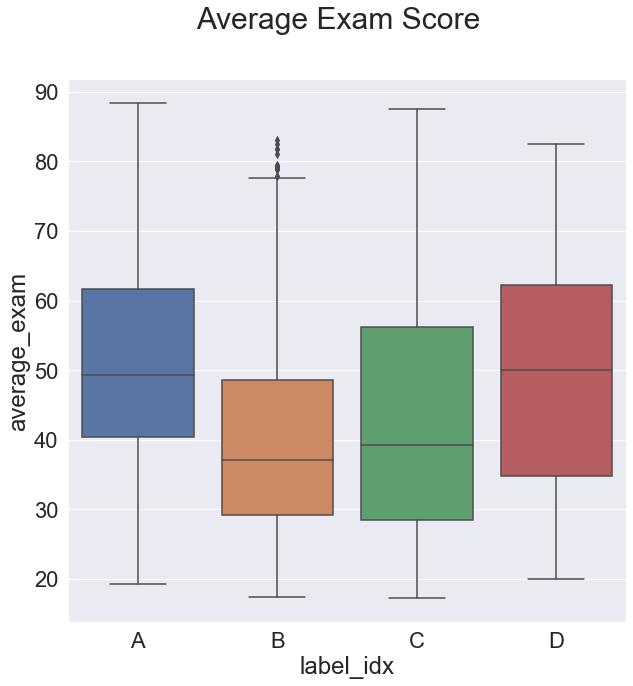

In [114]:
plt.figure(figsize=(10,10))
sns.boxplot(x='label_idx', y='average_exam', data=se_01)
plt.suptitle('Average Exam Score', fontsize=30);

In [115]:
stat, p = f_oneway(se_01[se_01.label_idx == 'A']['average_exam'], se_01[se_01.label_idx == 'B']['average_exam'],
                  se_01[se_01.label_idx == 'C']['average_exam'], se_01[se_01.label_idx == 'D']['average_exam'])
print(stat, p)

254.65416953486968 5.912827446060984e-157


In [116]:
stats.kruskal(se_01[se_01.label_idx == 'A']['average_exam'], se_01[se_01.label_idx == 'B']['average_exam'],
                  se_01[se_01.label_idx == 'C']['average_exam'], se_01[se_01.label_idx == 'D']['average_exam'])

KruskalResult(statistic=772.1333878373774, pvalue=4.783136599681183e-167)

# Does students from good school score better at National Exam?
## Unfortunately, not always true